##Sentinel-Hub Configuration

In [ ]:
!sentinelhub.config --show

{
  "instance_id": "",
  "sh_client_id": "",
  "sh_client_secret": "",
  "sh_base_url": "https://services.sentinel-hub.com",
  "sh_auth_base_url": "https://services.sentinel-hub.com",
  "geopedia_wms_url": "https://service.geopedia.world",
  "geopedia_rest_url": "https://www.geopedia.world/rest",
  "aws_access_key_id": "",
  "aws_secret_access_key": "",
  "aws_session_token": "",
  "aws_metadata_url": "https://roda.sentinel-hub.com",
  "aws_s3_l1c_bucket": "sentinel-s2-l1c",
  "aws_s3_l2a_bucket": "sentinel-s2-l2a",
  "opensearch_url": "http://opensearch.sentinel-hub.com/resto/api/collections/Sentinel2",
  "max_wfs_records_per_query": 100,
  "max_opensearch_records_per_query": 500,
  "max_download_attempts": 4,
  "download_sleep_time": 5,
  "download_timeout_seconds": 120.0,
  "number_of_download_processes": 1
}
Configuration file location: /usr/local/lib/python3.10/dist-packages/sentinelhub/config.json


In [ ]:
!sentinelhub.config --instance_id 9ab55a53-afee-4e0d-8402-0c8c0e1d227c #zindi
!sentinelhub.config --sh_client_id 9efe6f1a-0b0a-460f-bfe3-e52fc541a481
!sentinelhub.config --sh_client_secret 'o1mOF8{{Pu@6[%D:)IV^JTKnAj&jf8r>Yvt)s1|6'

The value of parameter 'instance_id' was updated to '9ab55a53-afee-4e0d-8402-0c8c0e1d227c'
The value of parameter 'sh_client_id' was updated to '9efe6f1a-0b0a-460f-bfe3-e52fc541a481'
The value of parameter 'sh_client_secret' was updated to 'o1mOF8{Pu@6[%D:)IV^JTKnAj&jf8r>Yvt)s1|6'


In [ ]:
!sentinelhub.config --show

{
  "instance_id": "9ab55a53-afee-4e0d-8402-0c8c0e1d227c",
  "sh_client_id": "9efe6f1a-0b0a-460f-bfe3-e52fc541a481",
  "sh_client_secret": "o1mOF8{Pu@6[%D:)IV^JTKnAj&jf8r>Yvt)s1|6",
  "sh_base_url": "https://services.sentinel-hub.com",
  "sh_auth_base_url": "https://services.sentinel-hub.com",
  "geopedia_wms_url": "https://service.geopedia.world",
  "geopedia_rest_url": "https://www.geopedia.world/rest",
  "aws_access_key_id": "",
  "aws_secret_access_key": "",
  "aws_session_token": "",
  "aws_metadata_url": "https://roda.sentinel-hub.com",
  "aws_s3_l1c_bucket": "sentinel-s2-l1c",
  "aws_s3_l2a_bucket": "sentinel-s2-l2a",
  "opensearch_url": "http://opensearch.sentinel-hub.com/resto/api/collections/Sentinel2",
  "max_wfs_records_per_query": 100,
  "max_opensearch_records_per_query": 500,
  "max_download_attempts": 4,
  "download_sleep_time": 5,
  "download_timeout_seconds": 120.0,
  "number_of_download_processes": 1
}
Configuration file location: /usr/local/lib/python3.10/dist-packa

## Mounting Google Drive

In [ ]:
# mount google drive
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
#!wget --no-check-certificate \
#   "https://github.com/simongrest/farm-pin-crop-detection-challenge/archive/refs/heads/master.zip" \
#    -O "/content/farm-pin-crop-detection.zip"


#zip_ref = zipfile.ZipFile('/content/farm-pin-crop-detection.zip', 'r') #Opens the zip file in read mode
#zip_ref.extractall('/content') #Extracts the files into the /content folder
#zip_ref.close()

##Libraries

In [ ]:
!pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install rasterio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install sentinelhub==3.5.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#!pip install eo-learn==1.0.1
!pip install eo-learn==1.1.0
#!pip install eo-learn==0.4.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import numpy as np
import math
from scipy import stats
import pandas as pd

import matplotlib as mpl
import matplotlib.pyplot as plt

from pathlib import Path
from enum import Enum
from tqdm import tqdm 
from contextlib import contextmanager  

import geopandas as gpd
from shapely.geometry import Polygon

import rasterio
from rasterio import Affine, MemoryFile
from rasterio.enums import Resampling

In [ ]:
from os import path, makedirs

In [ ]:
from sentinelhub import BBoxSplitter, BBox, CRS, CustomUrlParam

In [ ]:
from eolearn.core import (
    EOTask,
    EOPatch,
    EOWorkflow,
    linearly_connect_tasks,
    FeatureType,
    OverwritePermission,
    LoadTask,
    SaveTask,
    EOExecutor,
    MergeFeatureTask,
)

In [ ]:
#!pip uninstall opencv-python-headless 
#!pip install opencv-python-headless==4.1.2.30

In [ ]:
!pip uninstall opencv-python

Found existing installation: opencv-python 4.7.0.72
Uninstalling opencv-python-4.7.0.72:
  Would remove:
    /usr/local/lib/python3.10/dist-packages/cv2/*
    /usr/local/lib/python3.10/dist-packages/opencv_python-4.7.0.72.dist-info/*
    /usr/local/lib/python3.10/dist-packages/opencv_python.libs/libQt5Core-39545cc7.so.5.15.0
    /usr/local/lib/python3.10/dist-packages/opencv_python.libs/libQt5Gui-48e93776.so.5.15.0
    /usr/local/lib/python3.10/dist-packages/opencv_python.libs/libQt5Test-c38a5234.so.5.15.0
    /usr/local/lib/python3.10/dist-packages/opencv_python.libs/libQt5Widgets-e69d94fb.so.5.15.0
    /usr/local/lib/python3.10/dist-packages/opencv_python.libs/libQt5XcbQpa-c112ba75.so.5.15.0
    /usr/local/lib/python3.10/dist-packages/opencv_python.libs/libX11-xcb-69166bdf.so.1.0.0
    /usr/local/lib/python3.10/dist-packages/opencv_python.libs/libXau-00ec42fe.so.6.0.0
    /usr/local/lib/python3.10/dist-packages/opencv_python.libs/libavcodec-16a334ab.so.59.37.100
    /usr/local/lib/py

In [ ]:
!pip3 install opencv-contrib-python

In [ ]:
!pip install opencv-python

In [ ]:
from eolearn.io import SentinelHubInputTask, SentinelHubEvalscriptTask, ExportToTiffTask
from eolearn.io.local_io import *
from eolearn.mask import CloudMaskTask
#from eolearn.mask.utilities import resize_images
from eolearn.geometry import VectorToRasterTask, ErosionTask
from eolearn.ml_tools import FractionSamplingTask
from eolearn.features import LinearInterpolationTask, SimpleFilterTask, InterpolationTask, ValueFilloutTask,\
                             HaralickTask, AddMaxMinNDVISlopeIndicesTask, AddMaxMinTemporalIndicesTask,\
                             AddSpatioTemporalFeaturesTask, HOGTask, MaxNDVICompositingTask, LocalBinaryPatternTask

In [ ]:
from eolearn.features import NormalizedDifferenceIndexTask

In [ ]:
!pip install s2cloudless

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 244.4/244.4 kB 21.4 MB/s eta 0:00:00
  Attempting uninstall: sentinelhub
    Found existing installation: sentinelhub 3.5.1
    Uninstalling sentinelhub-3.5.1:
      Successfully uninstalled sentinelhub-3.5.1


In [ ]:
from s2cloudless import S2PixelCloudDetector

##Paths

In [ ]:
#!pwd

In [ ]:
#!ls

In [ ]:
data_path = Path('/content/gdrive/My Drive/Colab Notebooks/Zindi')

In [ ]:
# go to root directory
#%cd $data_path

In [ ]:
#sentinel_path = data_path/'sentinel'

In [ ]:
output_path   = Path('/content/gdrive/My Drive/Colab Notebooks/Zindi/output')

shape_path    = output_path/'shapes'
patch_path    = output_path/'patches2'
feature_path  = output_path/'features'

shape_path.mkdir(exist_ok=True, parents=True)
patch_path.mkdir(exist_ok=True, parents=True)
feature_path.mkdir(exist_ok=True, parents=True)

In [ ]:
!pwd

/content


## Define AoI

####Load shapefile

In [ ]:
train_test_gpdf = gpd.read_file(r'/content/gdrive/My Drive/Colab Notebooks/Zindi/train_test_shp/train_test_shp.shp')

In [ ]:
orange_river_crs = CRS.UTM_34S
train_test_gpdf = train_test_gpdf.to_crs(crs={'init': CRS.ogc_string(orange_river_crs)})

/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [ ]:
####Create a buffer around union of all shapes
orange_river = train_test_gpdf.geometry.unary_union.buffer(400)

####Split the buffered zone into boxes

In [ ]:
bbox_splitter = BBoxSplitter([orange_river], orange_river_crs, (6,5), reduce_bbox_sizes=False) # 6 x 5 gives roughly square boxes

In [ ]:
bbox_list = np.array(bbox_splitter.get_bbox_list())
print(bbox_list)

[BBox(((535329.7703788084, 6846758.109461494), (548617.0052632861, 6860214.913734847)), crs=CRS('32734'))
 BBox(((548617.0052632861, 6846758.109461494), (561904.2401477637, 6860214.913734847)), crs=CRS('32734'))
 BBox(((561904.2401477637, 6819844.500914789), (575191.4750322413, 6833301.305188142)), crs=CRS('32734'))
 BBox(((561904.2401477637, 6833301.305188142), (575191.4750322413, 6846758.109461494)), crs=CRS('32734'))
 BBox(((561904.2401477637, 6846758.109461494), (575191.4750322413, 6860214.913734847)), crs=CRS('32734'))
 BBox(((575191.4750322413, 6806387.696641437), (588478.709916719, 6819844.500914789)), crs=CRS('32734'))
 BBox(((575191.4750322413, 6819844.500914789), (588478.709916719, 6833301.305188142)), crs=CRS('32734'))
 BBox(((575191.4750322413, 6833301.305188142), (588478.709916719, 6846758.109461494)), crs=CRS('32734'))
 BBox(((588478.709916719, 6792930.892368084), (601765.9448011967, 6806387.696641437)), crs=CRS('32734'))
 BBox(((588478.709916719, 6806387.696641437), (601

In [ ]:
info_list = np.array(bbox_splitter.get_info_list())
print(info_list)

[{'parent_bbox': BBox(((535329.7703788084, 6792930.892368084), (615053.1796856744, 6860214.913734847)), crs=CRS('32734')), 'index_x': 0, 'index_y': 4}
 {'parent_bbox': BBox(((535329.7703788084, 6792930.892368084), (615053.1796856744, 6860214.913734847)), crs=CRS('32734')), 'index_x': 1, 'index_y': 4}
 {'parent_bbox': BBox(((535329.7703788084, 6792930.892368084), (615053.1796856744, 6860214.913734847)), crs=CRS('32734')), 'index_x': 2, 'index_y': 2}
 {'parent_bbox': BBox(((535329.7703788084, 6792930.892368084), (615053.1796856744, 6860214.913734847)), crs=CRS('32734')), 'index_x': 2, 'index_y': 3}
 {'parent_bbox': BBox(((535329.7703788084, 6792930.892368084), (615053.1796856744, 6860214.913734847)), crs=CRS('32734')), 'index_x': 2, 'index_y': 4}
 {'parent_bbox': BBox(((535329.7703788084, 6792930.892368084), (615053.1796856744, 6860214.913734847)), crs=CRS('32734')), 'index_x': 3, 'index_y': 1}
 {'parent_bbox': BBox(((535329.7703788084, 6792930.892368084), (615053.1796856744, 6860214.913

In [ ]:
len(info_list)

12

In [ ]:
# Create patchIDs
patchIDs = []
for idx, [bbox, info] in enumerate(zip(bbox_list, info_list)):
    patchIDs.append(idx)

print(patchIDs)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]


#### Prepare info of selected EOPatches

In [ ]:
geometry = [Polygon(bbox.get_polygon()) for bbox in bbox_list[patchIDs]]
print(geometry)

[<shapely.geometry.polygon.Polygon object at 0x7f09dd68a750>, <shapely.geometry.polygon.Polygon object at 0x7f09dd68a5d0>, <shapely.geometry.polygon.Polygon object at 0x7f09dd68a590>, <shapely.geometry.polygon.Polygon object at 0x7f09dd68a4d0>, <shapely.geometry.polygon.Polygon object at 0x7f09dd68a450>, <shapely.geometry.polygon.Polygon object at 0x7f09dd68a650>, <shapely.geometry.polygon.Polygon object at 0x7f09dd68a350>, <shapely.geometry.polygon.Polygon object at 0x7f09dd68a310>, <shapely.geometry.polygon.Polygon object at 0x7f09dd68a2d0>, <shapely.geometry.polygon.Polygon object at 0x7f09dd68a410>, <shapely.geometry.polygon.Polygon object at 0x7f09dd68a3d0>, <shapely.geometry.polygon.Polygon object at 0x7f09dd68a290>]


In [ ]:
idxs_x = [info['index_x'] for info in info_list[patchIDs]]
idxs_y = [info['index_y'] for info in info_list[patchIDs]]
print(idxs_x)
print(idxs_y)

[0, 1, 2, 2, 2, 3, 3, 3, 4, 4, 5, 5]
[4, 4, 2, 3, 4, 1, 2, 3, 0, 1, 0, 1]


In [ ]:
gdf = gpd.GeoDataFrame({'index_x': idxs_x, 'index_y': idxs_y}, 
                       crs={'init': CRS.ogc_string(orange_river_crs)}, 
                       geometry=geometry)

# save to shapefile
print(shape_path)
shapefile_name = shape_path/'selected_orange_river_bboxes.shp'
gdf.to_file(shapefile_name)

/content/gdrive/My Drive/Colab Notebooks/Zindi/output/shapes


/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


####Plot grid

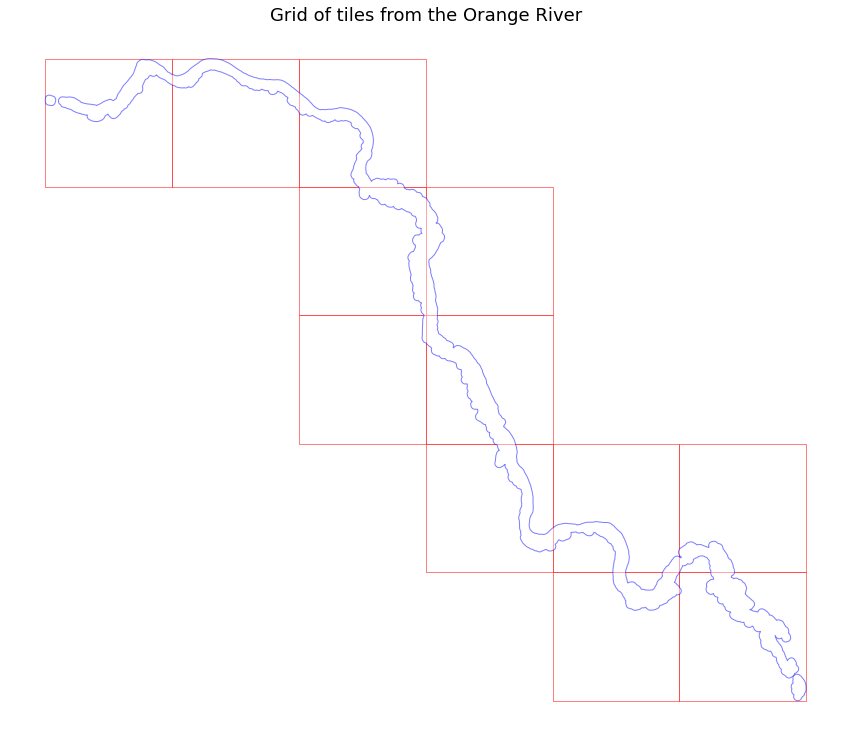

In [ ]:
fig, ax = plt.subplots(figsize=(15, 15))
gdf.plot(ax=ax,facecolor='w',edgecolor='r',alpha=0.5)
orange_river_gpdf = gpd.GeoDataFrame(geometry=[orange_river])
orange_river_gpdf.plot(ax=ax, facecolor='w',edgecolor='b',alpha=0.5)
ax.set_title('Grid of tiles from the Orange River', size=18);
plt.axis('off')
plt.show()

##Creating new train and test shape files

In [ ]:
#df.groupby('Group_Id').apply(lambda x: x.sample(1)).reset_index(drop=True)
#or
#df.groupby('Group_Id').apply(pd.DataFrame.sample, n=1).reset_index(drop=True)

In [ ]:
land_cover_path = Path('/content/gdrive/My Drive/Colab Notebooks/Zindi/train')
land_cover_data = gpd.read_file(land_cover_path)
land_cover_data.shape

(2497, 5)

In [ ]:
import scipy.sparse as sp

x,y = sp.coo_matrix(land_cover_data.isnull()).nonzero()
print(list(zip(x,y)))

[(800, 4), (1162, 4), (2402, 4)]


In [ ]:
print(land_cover_data.loc[[800]])

     Field_Id  Area  Subregion Crop_Id_Ne geometry
800      1170   0.0          0          8     None


In [ ]:
print(land_cover_data.loc[[1162]])

      Field_Id  Area  Subregion Crop_Id_Ne geometry
1162      1685   0.0          0          8     None


In [ ]:
print(land_cover_data.loc[[2402]])

      Field_Id  Area  Subregion Crop_Id_Ne geometry
2402      3472   0.0          0          6     None


In [ ]:
print(land_cover_data.loc[[1]])

   Field_Id     Area  Subregion Crop_Id_Ne  \
1         2  2.06441          3          6   

                                            geometry  
1  POLYGON ((2468428.906 -3351993.173, 2468346.03...  


In [ ]:
print(land_cover_data.groupby('Crop_Id_Ne').size())

Crop_Id_Ne
1    142
2      7
3     95
4    536
5    283
6    147
7    267
8    943
9     77
dtype: int64


In [ ]:
land_cover_data.head()

,Field_Id,Area,Subregion,Crop_Id_Ne,geometry
0,1,0.915905,3,8,"POLYGON ((2467881.175 -3352032.059, 2468026.16..."
1,2,2.064410,3,6,"POLYGON ((2468428.906 -3351993.173, 2468346.03..."
2,3,1.080300,3,8,"POLYGON ((2468333.745 -3352058.485, 2468336.65..."
3,4,1.316190,3,8,"POLYGON ((2468607.858 -3352012.338, 2468597.53..."
4,7,5.529220,3,8,"POLYGON ((2468646.085 -3351706.202, 2468490.77..."


In [ ]:
land_cover_data.dropna(inplace=True)

In [ ]:
land_cover_data.shape

(2494, 5)

In [ ]:
print(land_cover_data.groupby('Crop_Id_Ne').size())

Crop_Id_Ne
1    142
2      7
3     95
4    536
5    283
6    146
7    267
8    941
9     77
dtype: int64


In [ ]:
type(land_cover_data)

geopandas.geodataframe.GeoDataFrame

In [ ]:
print(land_cover_data.drop(land_cover_data[land_cover_data['Crop_Id_Ne'] == '2'].index))

      Field_Id      Area  Subregion Crop_Id_Ne  \
0            1  0.915905          3          8   
1            2  2.064410          3          6   
2            3  1.080300          3          8   
3            4  1.316190          3          8   
4            7  5.529220          3          8   
...        ...       ...        ...        ...   
2492      3598  4.660920          7          6   
2493      3599  4.829750          7          6   
2494      3600  7.543830          7          6   
2495      3602  5.144850          6          6   
2496      3603  0.774865          3          6   

                                               geometry  
0     POLYGON ((2467881.175 -3352032.059, 2468026.16...  
1     POLYGON ((2468428.906 -3351993.173, 2468346.03...  
2     POLYGON ((2468333.745 -3352058.485, 2468336.65...  
3     POLYGON ((2468607.858 -3352012.338, 2468597.53...  
4     POLYGON ((2468646.085 -3351706.202, 2468490.77...  
...                                                

In [ ]:
land_cover_data.shape

(2494, 5)

In [ ]:
land_cover_data.drop(land_cover_data[land_cover_data['Crop_Id_Ne'] == '2'].index, inplace=True)

In [ ]:
land_cover_data.shape

(2487, 5)

In [ ]:
land_cover_data.drop(land_cover_data[land_cover_data['Crop_Id_Ne'] == '9'].index, inplace=True)

In [ ]:
land_cover_data.shape

(2410, 5)

In [ ]:
print(land_cover_data.groupby('Crop_Id_Ne').size())

Crop_Id_Ne
1    142
3     95
4    536
5    283
6    146
7    267
8    941
dtype: int64


In [ ]:
land_cover_data.Crop_Id_Ne.unique()

array(['8', '6', '7', '1', '5', '3', '4'], dtype=object)

In [ ]:
test_data = land_cover_data.sample(n=360)

In [ ]:
test_data.Crop_Id_Ne.unique()

array(['4', '7', '6', '3', '5', '8', '1'], dtype=object)

In [ ]:
print(test_data.groupby('Crop_Id_Ne').size())

Crop_Id_Ne
1     22
3     21
4     83
5     44
6     21
7     41
8    128
dtype: int64


In [ ]:
test_new_360  = data_path/'test_new_360'
test_new_360.mkdir(exist_ok=True, parents=True)

In [ ]:
test_data.to_file(test_new_360/"test_new_360.shp")

In [ ]:
cond = land_cover_data['Field_Id'].isin(test_data['Field_Id'])
land_cover_data.drop(land_cover_data[cond].index, inplace = True)

In [ ]:
land_cover_data

,Field_Id,Area,Subregion,Crop_Id_Ne,geometry
0,1,0.915905,3,8,"POLYGON ((2467881.175 -3352032.059, 2468026.16..."
2,3,1.080300,3,8,"POLYGON ((2468333.745 -3352058.485, 2468336.65..."
3,4,1.316190,3,8,"POLYGON ((2468607.858 -3352012.338, 2468597.53..."
4,7,5.529220,3,8,"POLYGON ((2468646.085 -3351706.202, 2468490.77..."
5,8,1.482710,3,8,"POLYGON ((2468639.338 -3351439.435, 2468677.96..."
...,...,...,...,...,...
2492,3598,4.660920,7,6,"POLYGON ((2384342.745 -3283256.510, 2384353.85..."
2493,3599,4.829750,7,6,"POLYGON ((2383912.135 -3283350.967, 2383935.94..."
2494,3600,7.543830,7,6,"POLYGON ((2384231.275 -3283492.534, 2384409.86..."
2495,3602,5.144850,6,6,"POLYGON ((2387552.792 -3280598.872, 2387782.98..."


In [ ]:
land_cover_data.Crop_Id_Ne.unique()

array(['8', '7', '1', '5', '3', '4', '6'], dtype=object)

In [ ]:
print(land_cover_data.groupby('Crop_Id_Ne').size())

Crop_Id_Ne
1    120
3     74
4    453
5    239
6    125
7    226
8    813
dtype: int64


In [ ]:
land_cover_data.shape

(2050, 5)

In [ ]:
train_new_2050  = data_path/'train_new_2050'
train_new_2050.mkdir(exist_ok=True, parents=True)
land_cover_data.to_file(train_new_2050/"train_new_2050.shp")

In [ ]:
test_path = Path('/content/gdrive/My Drive/Colab Notebooks/Zindi/test_new_360')
test_data = gpd.read_file(test_path)
test_data.shape

(360, 5)

In [ ]:
print(test_data.loc[[119]])

     Field_Id     Area  Subregion Crop_Id_Ne  \
119      2402  1.78221          3          7   

                                              geometry  
119  POLYGON ((2463283.387 -3344211.955, 2463295.45...  


In [ ]:
x,y = sp.coo_matrix(test_data.isnull()).nonzero()
print(list(zip(x,y)))

[]


In [ ]:
test_data.to_csv('Farmpin_test.csv')

In [ ]:
df1 = pd.read_csv(data_path/'Farmpin_training.csv') 
df2 = pd.read_csv(data_path/'Farmpin_test.csv')

In [ ]:
df1.shape

(2410, 2)

In [ ]:
df2.shape

(360, 2)

In [ ]:
df3 = df1[~df1['field_id'].isin(df2['field_id'])]

In [ ]:
df3.shape

(2051, 2)

In [ ]:
df3.head()

,field_id,crop_id
0,1,8
2,3,8
3,4,8
4,7,8
5,8,8


In [ ]:
df3.to_csv(data_path/'Farmpin_training.csv')

## Create an EO Learn workflow to:
1. Read data from disk
2. Create a cloud mask
3. Add NDVI and euclidean norm features
4. Add Spatio temporal features
6. Add a raster mask with the target crop for each field polygon

###Create EO-learn task to read Sentinel imagery from disk

In [ ]:
# use context manager so DatasetReader and MemoryFile get cleaned up automatically
@contextmanager
def resample_raster(raster, size):
    #print("raster.bounds:", raster.bounds) 
    # raster.bounds: BoundingBox(left=499980.0, bottom=6790240.0, right=609780.0, top=6900040.0)
    t = raster.transform
    #print("t:", t) 
    # | 60.00, 0.00, 499980.00|
    # | 0.00,-60.00, 6900040.00|
    # | 0.00, 0.00, 1.00|
    #print(type(t))
    #print(t * (0, 0))  # gives the UL corner of raster (499980, 6900040)
    #print(t * (raster.width, raster.height))   # gives the LR corner of the raster # (609780, 6790240)

    
    #print("raster.height:", raster.height) # 1830
    #print("raster.width:", raster.width)   # 1830
    scale = size//raster.height # 10980/1830
    #print("scale:", scale) # 6

    # rescale the metadata
    #print("t.a, t.b, t.c, t.d, t.e, t.f", t.a, t.b, t.c, t.d, t.e, t.f) # t.a, t.b, t.c, t.d, t.e, t.f 60.0 0.0 499980.0 0.0 -60.0 6900040.0
    transform = Affine(t.a / scale, t.b, t.c, t.d, t.e / scale, t.f) #| 10.00, 0.00, 499980.00|
                                                                     #| 0.00,-10.00, 6900040.00|
                                                                     #| 0.00, 0.00, 1.00|
    #print(transform)
    height = raster.height * scale 
    #print("height:", height) # 10980
    width = raster.width * scale
    #print("width:", width)  # 10980

    profile = raster.profile
    #print(raster.profile)
    # {'driver': 'JP2OpenJPEG', 
    # 'dtype': 'uint16',
    # 'nodata': None,
    # 'width': 1830,
    # 'height': 1830,
    # 'count': 1,
    # 'crs': CRS.from_epsg(32734),
    # 'transform': Affine(60.0, 0.0, 499980.0, 0.0, -60.0, 6900040.0),
    # 'blockxsize': 192,
    # 'blockysize': 192,
    # 'tiled': True}
    profile.update(transform=transform, driver='GTiff', height=height, width=width)

    #profile.update({"driver": "GTiff",
    #                "height": 10980,
    #                "width": 10980,
    #                "transform": transform})
    #profile['transform'] = transform
    #profile['driver'] = 'GTiff'
    #profile['height'] = height
    #profile['width'] = width
    #print(raster.profile)

    data = raster.read( # Note changed order of indexes, arrays are band, row, col order not row, col, band
            out_shape=(raster.count, height, width),
            resampling=Resampling.bilinear)
    #print(data.shape) # (1, 10980, 10980)
    #print(type(data)) # <class 'numpy.ndarray'>

    with MemoryFile() as memfile:
        with memfile.open(**profile) as dataset: # Open as DatasetWriter
            dataset.write(data)
            del data

        with memfile.open() as dataset:  # Reopen as DatasetReader
            yield dataset  # Note yield not return 

In [ ]:
class LoadFromJP2(BaseLocalIoTask):
   
    def __init__(self, feature, folder=None, *, timestamp_size=None, **kwargs):
      
        super().__init__(feature, folder=folder, **kwargs)

        self.timestamp_size = timestamp_size
        self.no_data_value  = np.nan
        #print("In ImportFromJP2")

    @staticmethod
    def _get_reading_window(width, height, data_bbox, eopatch_bbox):
        """ Calculates a window in pixel coordinates for which data will be read from an image
        """
        if eopatch_bbox.crs is not data_bbox.crs:
            eopatch_bbox = eopatch_bbox.transform(data_bbox.crs)

        # The following will be in the future moved to sentinelhub-py
        #print("In _get_reading_window:\n")
        #print("width: ", width) # 10980
        #print("height: ", height) # 10980
        #print("data_bbox.lower_left: ", data_bbox.lower_left)
        #print("data_bbox.upper_right: ", data_bbox.upper_right)
        #print("eopatch_bbox.lower_left: ", eopatch_bbox.lower_left)
        #print("eopatch_bbox.upper_right: ", eopatch_bbox.upper_right)

        #data_bbox.lower_left:  (499980.0, 6790240.0)
        #data_bbox.upper_right:  (609780.0, 6900040.0)
        #eopatch_bbox.lower_left:  (548617.0052632861, 6846758.109461494)
        #eopatch_bbox.upper_right:  (561904.2401477637, 6860214.913734847)
        
        data_ul_x, data_lr_y = data_bbox.lower_left
        data_lr_x, data_ul_y = data_bbox.upper_right

        res_x = abs(data_ul_x - data_lr_x) / width
        #print("res_x:", res_x) #10
        res_y = abs(data_ul_y - data_lr_y) / height
        #print("res_y:", res_y) #10

        ul_x, lr_y = eopatch_bbox.lower_left
        lr_x, ul_y = eopatch_bbox.upper_right

        # If these coordinates wouldn't be rounded here, rasterio.io.DatasetReader.read would round
        # them in the same way
        top = round((data_ul_y - ul_y) / res_y)
        left = round((ul_x - data_ul_x) / res_x)
        bottom = round((data_ul_y - lr_y) / res_y)
        right = round((lr_x - data_ul_x) / res_x)

        #print("top, bottom, left, right: ", top, bottom, left, right)
        #top, bottom, left, right:  3983 5328 4863 6192

        if abs(left-right)==1328:
          left = left-1

        if abs(bottom-top)==1346:
          bottom = bottom-1

        return (top, bottom), (left, right)
    
    def execute(self, eopatch=None, *, fn_exp='../**/*B*.jp2'):

        #print(eopatch)      
        #print("In add_data execute()")
        #print(type(self.feature))   #<class 'tuple'>
        #print(self.feature[0])  #FeatureType.DATA
        #print(self.feature[1])  #BANDS
        feature_type = self.feature[0]
        feature_name = self.feature[1]
  
        #print(feature_type, feature_name) #FeatureType.DATA BANDS
        if eopatch is None:
            #print("here")
            eopatch = EOPatch()
                        
        #get jp2 files matching filename expression

        #for f in self.folder.glob(fn_exp):
          #print(f)
          #print("\n")

        jp2_files = [[*f.stem.split('_'),f] for f in self.folder.glob(fn_exp)] # glob is used to return all file paths that match a specific pattern
        #print(jp2_files)
        jp2_df = pd.DataFrame(jp2_files)
        #print(jp2_df.head())
        jp2_df.columns = ['tile','date','band','filename']
        #print(jp2_df.head())
        
        
        band_order = {
                        'B01':0,
                        'B02':1,
                        'B03':2,
                        'B04':3,
                        'B05':4,
                        'B06':5,
                        'B07':6,
                        'B08':7,
                        'B8A':8,
                        'B09':9,
                        'B10':10,
                        'B11':11,
                        'B12':12
                    }

        jp2_df['band_order'] = jp2_df.band.map(band_order) #Added a new column band_order with interger values
        #print(jp2_df.head())

        jp2_df.sort_values(by=['date','tile','band_order'],inplace=True)
        #print(jp2_df.head()) # Sorted row according to date, tile, band_order
        
        dates = jp2_df.date.unique()
        #print(dates)        #['20170101T082332' '20170131T082151' '20170210T082051' '20170312T082001'
                            #'20170322T081611' '20170531T082011' '20170620T082011' '20170710T082011'
                            #'20170715T081609' '20170804T081559' '20170819T082011']
        tiles = jp2_df.tile.unique()
        #print(tiles)        # ['T34JEP']
        #exit()
        bands = list(band_order.keys())
        #print(bands)        #['B01', 'B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B8A', 'B09', 'B10', 'B11', 'B12']
        
        date_data_list = list() #list to hold data for each date
        #print(date_data_list) # []

        #iterate through all files and add data
        for date in dates:
            bands_data_list = list() #list to hold data for each band
            for band in bands:
                tile_data_list = list()
                for tile in tiles:
                    #print("tile = ", tile)
                    filename_series = jp2_df[(jp2_df.date==date)
                                     &(jp2_df.band==band)
                                     &(jp2_df.tile==tile)].filename
                    #print("filename_series.values[0]:", filename_series.values[0])  #2017-01-01/IMG_DATA/T34JEP_20170101T082332_B01.jp2
                    #print(len(filename_series))
                    if len(filename_series) > 0:
                        filename=filename_series.values[0]
                        #print(filename)
                    else: continue
                    with rasterio.open(filename) as source:
                        with resample_raster(source, size = 10980) as resampled:
                            #print("resampled.profile: ", resampled.profile)
                            #{'driver': 'GTiff',
                            # 'dtype': 'uint16',
                            # 'nodata': None,
                            # 'width': 10980,
                            # 'height': 10980,
                            # 'count': 1,
                            # 'crs': CRS.from_epsg(32734),
                            # 'transform': Affine(10.0, 0.0, 499980.0, 0.0, -10.0, 6900040.0),
                            # 'blockxsize': 640,
                            # 'blockysize': 640,
                            # 'tiled': True,
                            # 'interleave': 'band'}
                            #print("resampled.bounds: ", resampled.bounds)
                            # BoundingBox(left=499980.0, bottom=6790240.0, right=609780.0, top=6900040.0)
                            data_bbox = BBox(resampled.bounds, CRS(resampled.crs.to_epsg()))
                            # BBox(left=499980.0, bottom=6790240.0, right=609780.0, top=6900040.0)
                            
                            if rasterio.coords.disjoint_bounds(rasterio.coords.BoundingBox(*data_bbox), 
                                                               rasterio.coords.BoundingBox(*(eopatch))):
                                continue

                            #print("resampled.width: ", resampled.width)   # 10980
                            #print("resampled.height: ", resampled.height) # 10980
                            reading_window = self._get_reading_window(
                                resampled.width, resampled.height, data_bbox, eopatch)

                            data = resampled.read(window=reading_window, boundless=True, 
                                                  fill_value=self.no_data_value)
                            #print("data shape: ", data.shape) # data shape:  (1, 1345, 1329)
                            
                            if self.image_dtype is not None:
                                print("self.image_dtype is not None.")
                                data = data.astype(self.image_dtype)
                                
                            tile_data_list.append(data)

                # Inside: for band in bands:
                #Choose the values from the non-zero tile or average the two sets of non-zero value
                
                #print("tile_data_list:", tile_data_list)

                # [array([[[1490, 1489, 1486, ..., 1290, 1291, 1291],
                # [1488, 1486, 1483, ..., 1289, 1291, 1291],
                # [1486, 1484, 1481, ..., 1289, 1290, 1290],
                # ...,
                # [1388, 1378, 1372, ..., 1298, 1293, 1291],
                # [1385, 1376, 1369, ..., 1297, 1293, 1290],
                # [1382, 1373, 1367, ..., 1296, 1292, 1290]]], dtype=uint16)]

                if len(tile_data_list) > 1:
                    #print("tile_data_list>1")
                    merged_tile_data = np.where((tile_data_list[0]!=0) & (tile_data_list[1]!=0),
                                            (tile_data_list[0]+tile_data_list[1])/2,
                                            np.where(tile_data_list[0]==0, tile_data_list[1], tile_data_list[0])
                                           )
                else:
                    merged_tile_data = tile_data_list[0]

                #print("merged_tile_data.shape: ", merged_tile_data.shape) # (1, 1345, 1329)
                #print("merged_tile_data.shape.squeeze(): ", merged_tile_data.squeeze().shape) # (1345, 1329)
                bands_data_list.append(merged_tile_data.squeeze())
                #print("Length of bands_data_list: ", len(bands_data_list)) # 13 bands
                
            # In for date in dates:        
            date_data_list.append(np.stack(bands_data_list,axis=-1)) 
            #print("date_data_list[0].shape: ", date_data_list[0].shape) # (1345, 1329, 13)
            #print("Length of date_data_list: ", len(date_data_list))  # 11 dates
        
        data = np.stack(date_data_list,axis=0)
        #print("data.shape: ", data.shape)   # (11, 1345, 1329, 13)

        eop = EOPatch()
        eop.bbox = eopatch
        eop[feature_type][feature_name] = data/10000
        eop.timestamp = dates.tolist()
        
        meta_info= {
            'service_type': 'wcs',
            'size_x': '10m',
            'size_y': '10m'
          }
        
        eop.meta_info = meta_info
        #eopatch.add_feature(FeatureType.MASK, 'IS_DATA', np.ones((11, 1345, 1328, 1)))
        eop[FeatureType.MASK, 'IS_DATA'] = np.ones((11, 1345, 1329, 1)).astype('int64')

        #print("In add_data, eopatch: ", eop)
        return eop

In [ ]:
# Read in all available bands from disk
add_data = LoadFromJP2(feature=(FeatureType.DATA, 'BANDS'), folder=data_path)#sentinel_path)

In [ ]:
#bbox_list[11]

In [ ]:
#print(bbox_list[11])

In [ ]:
#eopatch=add_data.execute(EOPatch(bbox=bbox_list[11]).bbox)

In [ ]:
#eopatch

### Cloud Mask

In [ ]:
#cloud_classifier = S2PixelCloudDetector(average_over=2, dilation_size=1, all_bands=True)

In [ ]:
# TASK FOR CLOUD INFO
# Cloud detection is performed at 80m resolution 
# And the resulting cloud probability map and mask are scaled to EOPatch's resolution

#cloud_classifier = get_s2_pixel_cloud_detector(average_over=2, dilation_size=1, all_bands=True)
#add_clm = AddCloudMaskTask(cloud_classifier, 'BANDS', cm_size_y='80m', cm_size_x='80m', 
#                           cmask_feature='CLM', # cloud mask name
#                           cprobs_feature='CLP' # cloud prob. map name
#                          )

add_clm = CloudMaskTask(data_feature=(FeatureType.DATA, 'BANDS'),
                        all_bands=True, 
                        mono_features=('CLP', 'CLM'), 
                        mask_feature=None, 
                        processing_resolution=80, 
                        average_over=2, 
                        dilation_size=1,)
                        #mono_classifier=cloud_classifier)

###Task for Valid Mask

In [ ]:
class SentinelHubValidDataTask(EOTask):
    """
    Combine Sen2Cor's classification map with `IS_DATA` to define a `VALID_DATA_SH` mask
    The SentinelHub's cloud mask is asumed to be found in eopatch.mask['CLM']
    """

    def __init__(self, output_feature):
        self.output_feature = output_feature

    def execute(self, eopatch):
        eopatch[self.output_feature] = eopatch.mask["IS_DATA"].astype(bool) & (~eopatch.mask["CLM"].astype(bool))
        return eopatch

In [ ]:
# VALIDITY MASK
# Validate pixels using SentinelHub's cloud detection mask and region of acquisition
add_sh_validmask = SentinelHubValidDataTask((FeatureType.MASK, "VALID_DATA"))

### EO Tasks to compute NDVI and Euclidean Norm

In [ ]:
band_names = ["B02", "B03", "B04", "B08", "B11", "B12"]

In [ ]:
# CALCULATING NEW FEATURES
# NDVI: (B08 - B04)/(B08 + B04) #B04 : Red
# GNDVI: (B08 - B03)/(B08 + B03) #B03 : Green
# NDWI: (B03 - B08)/(B03 + B08)
# NDBI: (B11 - B08)/(B11 + B08)
ndvi = NormalizedDifferenceIndexTask(
    (FeatureType.DATA, "BANDS"), (FeatureType.DATA, "NDVI"), [band_names.index("B08"), band_names.index("B04")]
)

gndvi = NormalizedDifferenceIndexTask(
    (FeatureType.DATA, "BANDS"), (FeatureType.DATA, "GNDVI"), [band_names.index("B08"), band_names.index("B03")]
)

ndwi = NormalizedDifferenceIndexTask(
    (FeatureType.DATA, "BANDS"), (FeatureType.DATA, "NDWI"), [band_names.index("B03"), band_names.index("B08")]
)
ndbi = NormalizedDifferenceIndexTask(
    (FeatureType.DATA, "BANDS"), (FeatureType.DATA, "NDBI"), [band_names.index("B11"), band_names.index("B08")]
)

In [ ]:
class EuclideanNorm(EOTask):   
    """
    The tasks calculates Euclidian Norm of all bands within an array:
    norm = sqrt(sum_i Bi**2),
    where Bi are the individual bands within user-specified feature array.
    """
    def __init__(self, feature_name, in_feature_name):
        self.feature_name = feature_name
        self.in_feature_name = in_feature_name
    
    def execute(self, eopatch):
        arr = eopatch.data[self.in_feature_name]
        norm = np.sqrt(np.sum(arr**2, axis=-1))
        
        #eopatch.add_feature(FeatureType.DATA, self.feature_name, norm[..., np.newaxis])
        eopatch[FeatureType.DATA, self.feature_name] = norm[..., np.newaxis]
        #print("In Euclidean norm, eopatch: ", eopatch)
        return eopatch

In [ ]:
norm = EuclideanNorm('NORM','BANDS')

###Tasks for spatio-temporal features

In [ ]:
#Tasks for spatio temporal features
max_min_b4_idx = AddMaxMinTemporalIndicesTask(data_feature='BANDS', 
                                              data_index=3, 
                                              amax_data_feature='ARGMAX_B4', 
                                              amin_data_feature='ARGMIN_B4')
max_min_ndvi_idx = AddMaxMinTemporalIndicesTask(data_feature='NDVI')
max_min_ndvi_slope_idx = AddMaxMinNDVISlopeIndicesTask()
spatio_temp_feat = AddSpatioTemporalFeaturesTask(data_feature='BANDS')

### Task for rasterizing target classes

In [ ]:
class LULC(Enum):
    NO_DATA        = (0,  'No Data',          'black')
    COTTON         = (1,  'Cotton',           'xkcd:lime')
    VINEYARD       = (2,  'Vineyard',         'crimson')
    GRASS          = (3,  'Grass',            'orange')
    LUCERN         = (4,  'Lucern',           'xkcd:tan')
    MAIZE          = (5,  'Maize',            'xkcd:azure')
    PECAN          = (6,  'Pecan',            'xkcd:lightblue')
    VACANT         = (7,  'Vacant',           'xkcd:beige')
    
    def __init__(self, val1, val2, val3):
        self.id = val1
        self.class_name = val2
        self.color = val3

lulc_cmap = mpl.colors.ListedColormap([entry.color for entry in LULC])
#print(lulc_cmap.N)
lulc_norm = mpl.colors.BoundaryNorm(np.arange(-0.5, 9, 1), lulc_cmap.N)

In [ ]:
print(data_path)

/content/gdrive/My Drive/Colab Notebooks/Zindi


In [ ]:
train_land_cover_path = data_path/'train_new_2050'

In [ ]:
train_land_cover_data = gpd.read_file(train_land_cover_path)
train_land_cover_data

,Field_Id,Area,Subregion,Crop_Id_Ne,geometry
0,1,0.915905,3,8,"POLYGON ((2467881.175 -3352032.059, 2468026.16..."
1,3,1.080300,3,8,"POLYGON ((2468333.745 -3352058.485, 2468336.65..."
2,4,1.316190,3,8,"POLYGON ((2468607.858 -3352012.338, 2468597.53..."
3,7,5.529220,3,8,"POLYGON ((2468646.085 -3351706.202, 2468490.77..."
4,8,1.482710,3,8,"POLYGON ((2468639.338 -3351439.435, 2468677.96..."
...,...,...,...,...,...
2045,3598,4.660920,7,6,"POLYGON ((2384342.745 -3283256.510, 2384353.85..."
2046,3599,4.829750,7,6,"POLYGON ((2383912.135 -3283350.967, 2383935.94..."
2047,3600,7.543830,7,6,"POLYGON ((2384231.275 -3283492.534, 2384409.86..."
2048,3602,5.144850,6,6,"POLYGON ((2387552.792 -3280598.872, 2387782.98..."


In [ ]:
print(train_land_cover_data[train_land_cover_data['Crop_Id_Ne'] == '8'])

      Field_Id      Area  Subregion Crop_Id_Ne  \
0            1  0.915905          3          8   
1            3  1.080300          3          8   
2            4  1.316190          3          8   
3            7  5.529220          3          8   
4            8  1.482710          3          8   
...        ...       ...        ...        ...   
1911      3372  8.314330          5          8   
1912      3373  3.593180          5          8   
1913      3375  1.829300          5          8   
1914      3379  4.434240          5          8   
1915      3382  0.631806          2          8   

                                               geometry  
0     POLYGON ((2467881.175 -3352032.059, 2468026.16...  
1     POLYGON ((2468333.745 -3352058.485, 2468336.65...  
2     POLYGON ((2468607.858 -3352012.338, 2468597.53...  
3     POLYGON ((2468646.085 -3351706.202, 2468490.77...  
4     POLYGON ((2468639.338 -3351439.435, 2468677.96...  
...                                                

In [ ]:
train_land_cover_data.loc[train_land_cover_data["Crop_Id_Ne"] == "8", "Crop_Id_Ne"] = "2"

In [ ]:
train_land_cover_data.dropna(inplace=True)

In [ ]:
train_land_cover_data

,Field_Id,Area,Subregion,Crop_Id_Ne,geometry
0,1,0.915905,3,2,"POLYGON ((2467881.175 -3352032.059, 2468026.16..."
1,3,1.080300,3,2,"POLYGON ((2468333.745 -3352058.485, 2468336.65..."
2,4,1.316190,3,2,"POLYGON ((2468607.858 -3352012.338, 2468597.53..."
3,7,5.529220,3,2,"POLYGON ((2468646.085 -3351706.202, 2468490.77..."
4,8,1.482710,3,2,"POLYGON ((2468639.338 -3351439.435, 2468677.96..."
...,...,...,...,...,...
2045,3598,4.660920,7,6,"POLYGON ((2384342.745 -3283256.510, 2384353.85..."
2046,3599,4.829750,7,6,"POLYGON ((2383912.135 -3283350.967, 2383935.94..."
2047,3600,7.543830,7,6,"POLYGON ((2384231.275 -3283492.534, 2384409.86..."
2048,3602,5.144850,6,6,"POLYGON ((2387552.792 -3280598.872, 2387782.98..."


In [ ]:
print(train_land_cover_data[train_land_cover_data['Crop_Id_Ne'] == '8'])

Empty GeoDataFrame
Columns: [Field_Id, Area, Subregion, Crop_Id_Ne, geometry]
Index: []


In [ ]:
print(train_land_cover_data[train_land_cover_data['Crop_Id_Ne'] == '2'])

      Field_Id      Area  Subregion Crop_Id_Ne  \
0            1  0.915905          3          2   
1            3  1.080300          3          2   
2            4  1.316190          3          2   
3            7  5.529220          3          2   
4            8  1.482710          3          2   
...        ...       ...        ...        ...   
1911      3372  8.314330          5          2   
1912      3373  3.593180          5          2   
1913      3375  1.829300          5          2   
1914      3379  4.434240          5          2   
1915      3382  0.631806          2          2   

                                               geometry  
0     POLYGON ((2467881.175 -3352032.059, 2468026.16...  
1     POLYGON ((2468333.745 -3352058.485, 2468336.65...  
2     POLYGON ((2468607.858 -3352012.338, 2468597.53...  
3     POLYGON ((2468646.085 -3351706.202, 2468490.77...  
4     POLYGON ((2468639.338 -3351439.435, 2468677.96...  
...                                                

In [ ]:
train_land_cover_data.to_crs({'init': 'EPSG:32734'},inplace=True)

/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [ ]:
train_land_cover_data['Crop_Id_Ne'] = train_land_cover_data.Crop_Id_Ne.astype('int')

In [ ]:
rasterization_task_train = VectorToRasterTask(train_land_cover_data, 
                                        (FeatureType.MASK_TIMELESS, 'LULC_TRAIN'),
                                        values_column='Crop_Id_Ne', 
                                        raster_shape=(1345, 1329),   #(FeatureType.MASK, 'VALID_DATA'),
                                        raster_dtype=np.uint8)

In [ ]:
test_land_cover_path = data_path/'test_new_360'
test_land_cover_data = gpd.read_file(test_land_cover_path)
test_land_cover_data

,Field_Id,Area,Subregion,Crop_Id_Ne,geometry
0,977,1.943620,2,4,"POLYGON ((2419480.858 -3292533.575, 2419777.52..."
1,433,1.194930,3,7,"POLYGON ((2455498.767 -3335675.551, 2455527.57..."
2,1815,1.179230,4,4,"POLYGON ((2422338.499 -3300121.073, 2422341.62..."
3,2803,2.614270,2,4,"POLYGON ((2424009.079 -3307107.008, 2424012.25..."
4,3456,1.198600,2,6,"POLYGON ((2420941.738 -3293032.095, 2420772.21..."
...,...,...,...,...,...
355,1635,0.639124,2,8,"POLYGON ((2423783.301 -3304344.288, 2423763.43..."
356,1131,3.293870,5,7,"POLYGON ((2415847.084 -3292815.909, 2415984.15..."
357,1326,3.360860,3,8,"POLYGON ((2446411.840 -3338772.645, 2446545.93..."
358,1881,1.898520,2,3,"POLYGON ((2424140.484 -3299272.479, 2424068.60..."


In [ ]:
print(test_land_cover_data[test_land_cover_data['Crop_Id_Ne'] == '8'])

     Field_Id      Area  Subregion Crop_Id_Ne  \
16       3076  0.281994          6          8   
21       1310  1.493780          3          8   
23       3170  1.631230          3          8   
26       1289  2.939580          1          8   
28        744  5.142900          2          8   
..        ...       ...        ...        ...   
350      1997  0.515653          4          8   
352      2320  2.154600          6          8   
354      2820  3.214960          3          8   
355      1635  0.639124          2          8   
357      1326  3.360860          3          8   

                                              geometry  
16   POLYGON ((2389026.024 -3280126.270, 2389052.90...  
21   POLYGON ((2450268.632 -3342004.968, 2450386.23...  
23   POLYGON ((2435171.892 -3331424.910, 2435200.14...  
26   POLYGON ((2450179.158 -3340987.793, 2450464.89...  
28   POLYGON ((2421323.962 -3293171.119, 2421486.20...  
..                                                 ...  
350  POLYGON

In [ ]:
test_land_cover_data.loc[test_land_cover_data["Crop_Id_Ne"] == "8", "Crop_Id_Ne"] = "2"

In [ ]:
test_land_cover_data.dropna(inplace=True)
test_land_cover_data

,Field_Id,Area,Subregion,Crop_Id_Ne,geometry
0,977,1.943620,2,4,"POLYGON ((2419480.858 -3292533.575, 2419777.52..."
1,433,1.194930,3,7,"POLYGON ((2455498.767 -3335675.551, 2455527.57..."
2,1815,1.179230,4,4,"POLYGON ((2422338.499 -3300121.073, 2422341.62..."
3,2803,2.614270,2,4,"POLYGON ((2424009.079 -3307107.008, 2424012.25..."
4,3456,1.198600,2,6,"POLYGON ((2420941.738 -3293032.095, 2420772.21..."
...,...,...,...,...,...
355,1635,0.639124,2,2,"POLYGON ((2423783.301 -3304344.288, 2423763.43..."
356,1131,3.293870,5,7,"POLYGON ((2415847.084 -3292815.909, 2415984.15..."
357,1326,3.360860,3,2,"POLYGON ((2446411.840 -3338772.645, 2446545.93..."
358,1881,1.898520,2,3,"POLYGON ((2424140.484 -3299272.479, 2424068.60..."


In [ ]:
print(test_land_cover_data[test_land_cover_data['Crop_Id_Ne'] == '8'])

Empty GeoDataFrame
Columns: [Field_Id, Area, Subregion, Crop_Id_Ne, geometry]
Index: []


In [ ]:
print(test_land_cover_data[test_land_cover_data['Crop_Id_Ne'] == '2'])

     Field_Id      Area  Subregion Crop_Id_Ne  \
16       3076  0.281994          6          2   
21       1310  1.493780          3          2   
23       3170  1.631230          3          2   
26       1289  2.939580          1          2   
28        744  5.142900          2          2   
..        ...       ...        ...        ...   
350      1997  0.515653          4          2   
352      2320  2.154600          6          2   
354      2820  3.214960          3          2   
355      1635  0.639124          2          2   
357      1326  3.360860          3          2   

                                              geometry  
16   POLYGON ((2389026.024 -3280126.270, 2389052.90...  
21   POLYGON ((2450268.632 -3342004.968, 2450386.23...  
23   POLYGON ((2435171.892 -3331424.910, 2435200.14...  
26   POLYGON ((2450179.158 -3340987.793, 2450464.89...  
28   POLYGON ((2421323.962 -3293171.119, 2421486.20...  
..                                                 ...  
350  POLYGON

In [ ]:
test_land_cover_data.to_crs({'init': 'EPSG:32734'},inplace=True)

/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [ ]:
test_land_cover_data['Crop_Id_Ne'] = test_land_cover_data.Crop_Id_Ne.astype('int')

In [ ]:
rasterization_task_test = VectorToRasterTask(test_land_cover_data, 
                                        (FeatureType.MASK_TIMELESS, 'LULC_TEST'),
                                        values_column='Crop_Id_Ne', 
                                        raster_shape=(1345, 1329),   #(FeatureType.MASK, 'VALID_DATA'),
                                        raster_dtype=np.uint8)

### Task for saving to output

In [ ]:
path_out = '/content/gdrive/My Drive/Colab Notebooks/Zindi/output/patches2/'
if not path.isdir(path_out):
    makedirs(path_out)

In [ ]:
save = SaveTask(path_out, overwrite_permission=OverwritePermission.OVERWRITE_PATCH)

In [ ]:
path_out = Path(path_out)
#Same as patch_path

###Define the workflow

In [ ]:
workflow_nodes = linearly_connect_tasks(
    add_data,
    add_clm,
    add_sh_validmask,
    ndvi,
    #gndvi,
    ndwi,
    #ndbi,
    norm,
    #max_min_b4_idx,
    #max_min_ndvi_idx,
    #max_min_ndvi_slope_idx,
    #spatio_temp_feat,
    rasterization_task_train,
    rasterization_task_test,
    save
)

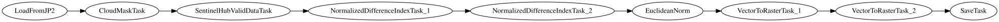

In [ ]:
workflow = EOWorkflow(workflow_nodes)

# Let's visualize it
workflow.dependency_graph("dep_graph.png")

### Execute the workflow for each patch

In [ ]:
#bbox_list[0]

In [ ]:
# Execute the workflow
time_interval = ['2017-01-01', '2017-08-20'] # time interval for the SH request
# Define additional parameters of the workflow
input_node = workflow_nodes[0]
save_node = workflow_nodes[-1]
# define additional parameters of the workflow
execution_args = []

for idx, bbox in enumerate(bbox_list[patchIDs]):
  #print(bbox_list[idx])
  #print(idx)
  #print(bbox)
  execution_args.append(
        {
            input_node: {"eopatch": EOPatch(bbox=bbox_list[idx]).bbox},
            save_node: {"eopatch_folder": f"eopatch_{idx}"},
        }
    )
  
# Execute the workflow
executor = EOExecutor(workflow, execution_args, save_logs=True)
executor.run(workers=1)

executor.make_report()

failed_ids = executor.get_failed_executions()
if failed_ids:
    raise RuntimeError(
        f"Execution failed EOPatches with IDs:\n{failed_ids}\n"
        f"For more info, check report at {executor.get_report_path()}"
    )

  0%|          | 0/12 [00:00<?, ?it/s]

In [ ]:
#eopatch = EOPatch.load(path_out/'eopatch_0')
eopatch = EOPatch.load('/content/gdrive/My Drive/Colab Notebooks/Zindi/output/patches1/eopatch_0')

In [ ]:
eopatch

EOPatch(
  data={
    BANDS: numpy.ndarray(shape=(11, 1345, 1329, 13), dtype=float64)
    CLP: numpy.ndarray(shape=(11, 1345, 1329, 1), dtype=float32)
    GNDVI: numpy.ndarray(shape=(11, 1345, 1329, 1), dtype=float64)
    NDBI: numpy.ndarray(shape=(11, 1345, 1329, 1), dtype=float64)
    NDVI: numpy.ndarray(shape=(11, 1345, 1329, 1), dtype=float64)
    NDWI: numpy.ndarray(shape=(11, 1345, 1329, 1), dtype=float64)
    NORM: numpy.ndarray(shape=(11, 1345, 1329, 1), dtype=float64)
  }
  mask={
    CLM: numpy.ndarray(shape=(11, 1345, 1329, 1), dtype=bool)
    IS_DATA: numpy.ndarray(shape=(11, 1345, 1329, 1), dtype=int64)
    VALID_DATA: numpy.ndarray(shape=(11, 1345, 1329, 1), dtype=bool)
  }
  data_timeless={
    ARGMAX_B4: numpy.ndarray(shape=(1345, 1329, 1), dtype=int64)
    ARGMAX_NDVI: numpy.ndarray(shape=(1345, 1329, 1), dtype=int64)
    ARGMAX_NDVI_SLOPE: numpy.ndarray(shape=(1345, 1329, 1), dtype=uint8)
    ARGMIN_B4: numpy.ndarray(shape=(1345, 1329, 1), dtype=int64)
    ARGMIN_NDVI

###Additional workflow for updating raster masks of training and test sets

In [ ]:
print(patch_path) # str('/content/gdrive/My Drive/Colab Notebooks/Zindi/output/patches2')

/content/gdrive/My Drive/Colab Notebooks/Zindi/output/patches2


In [ ]:
type(patch_path)

pathlib.PosixPath

In [ ]:
patch_path_str = str(patch_path)
type(patch_path_str)

str

In [ ]:
patch_path_str

'/content/gdrive/My Drive/Colab Notebooks/Zindi/output/patches2'

In [ ]:
# TASK TO LOAD EXISTING EOPATCHES
load = LoadTask(patch_path_str)

In [ ]:
workflow_nodes = linearly_connect_tasks(
    load,
    rasterization_task_train,
    rasterization_task_test,
    save
)

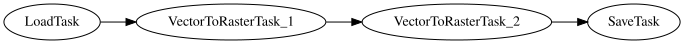

In [ ]:
workflow = EOWorkflow(workflow_nodes)

# Let's visualize it
workflow.dependency_graph()

In [ ]:
input_node = workflow_nodes[0]
save_node = workflow_nodes[-1]
execution_args = []
for idx in range(len(patchIDs)):
     execution_args.append({
         input_node: {'eopatch_folder': f'eopatch_{idx}'},
         save_node: {'eopatch_folder': f'eopatch_{idx}'}
     })
executor = EOExecutor(workflow, execution_args, save_logs=True)
executor.run(workers=1)#6, multiprocess=False)
executor.make_report()
failed_ids = executor.get_failed_executions()
if failed_ids:
    raise RuntimeError(
        f"Execution failed EOPatches with IDs:\n{failed_ids}\n"
        f"For more info, check report at {executor.get_report_path()}"
    )

  0%|          | 0/12 [00:00<?, ?it/s]

DEBUG:eolearn.core.eoworkflow:Computing LoadTask(*[], **{'eopatch_folder': 'eopatch_0'})
DEBUG:eolearn.core.eoworkflow:Computing VectorToRasterTask(*[EOPatch(
  data={
    BANDS: numpy.ndarray(shape=(11, 1345, 1329, 13), dtype=float64)
    CLP: numpy.ndarray(shape=(11, 1345, 1329, 1), dtype=float32)
    GNDVI: numpy.ndarray(shape=(11, 1345, 1329, 1), dtype=float64)
    NDBI: numpy.ndarray(shape=(11, 1345, 1329, 1), dtype=float64)
    NDVI: numpy.ndarray(shape=(11, 1345, 1329, 1), dtype=float64)
    NDWI: numpy.ndarray(shape=(11, 1345, 1329, 1), dtype=float64)
    NORM: numpy.ndarray(shape=(11, 1345, 1329, 1), dtype=float64)
  }
  mask={
    CLM: numpy.ndarray(shape=(11, 1345, 1329, 1), dtype=bool)
    IS_DATA: numpy.ndarray(shape=(11, 1345, 1329, 1), dtype=int64)
    VALID_DATA: numpy.ndarray(shape=(11, 1345, 1329, 1), dtype=bool)
  }
  data_timeless={
    ARGMAX_B4: numpy.ndarray(shape=(1345, 1329, 1), dtype=int64)
    ARGMAX_NDVI: numpy.ndarray(shape=(1345, 1329, 1), dtype=int64)
   

### The structure of the patches
```
EOPatch(
  data: {
    BANDS: numpy.ndarray(shape=(11, 1345, 1329, 13), dtype=float64)
    CLP: numpy.ndarray(shape=(11, 1345, 1329, 1), dtype=float32)
    NDVI: numpy.ndarray(shape=(11, 1345, 1329, 1), dtype=float64)
    NORM: numpy.ndarray(shape=(11, 1345, 1329, 1), dtype=float64)
  }
  mask: {
    CLM: numpy.ndarray(shape=(11, 1345, 1329, 1), dtype=bool)
    VALID_DATA: numpy.ndarray(shape=(11, 1345, 1329, 1), dtype=bool)
  }
  scalar: {}
  label: {}
  vector: {}
  data_timeless: {
    ARGMAX_B4: numpy.ndarray(shape=(1345, 1329, 1), dtype=int64)
    ARGMAX_NDVI: numpy.ndarray(shape=(1345, 1329, 1), dtype=int64)
    ARGMAX_NDVI_SLOPE: numpy.ndarray(shape=(1345, 1329, 1), dtype=uint8)
    ARGMIN_B4: numpy.ndarray(shape=(1345, 1329, 1), dtype=int64)
    ARGMIN_NDVI: numpy.ndarray(shape=(1345, 1329, 1), dtype=int64)
    ARGMIN_NDVI_SLOPE: numpy.ndarray(shape=(1345, 1329, 1), dtype=uint8)
    STF: numpy.ndarray(shape=(1345, 1329, 20), dtype=float64)
  }
  mask_timeless: {
    LULC: numpy.ndarray(shape=(1345, 1329, 1), dtype=uint8)
  }
  scalar_timeless: {}
  label_timeless: {}
  vector_timeless: {}
  meta_info: {
    service_type: 'wcs'
    size_x: '10m'
    size_y: '10m'
  }
  bbox: BBox(((535329.7703788084, 6846758.109461494), (548617.0052632861, 6860214.913734847)), crs=EPSG:32734)
  timestamp: [datetime.datetime(2017, 1, 1, 8, 23, 32), ..., datetime.datetime(2017, 8, 19, 8, 20, 11)], length=11
)
```

## Visualise the processed imagery

In [ ]:
## Indexes for arranging the grid tiles

indexes = [[ 0,  1,  4],
                   [ 3,   7],
                   [ 2,   6], 
                        [ 5,  9, 11],
                            [ 8, 10]]

places  = [[ 1,  2,  3],
                   [ 9,  10],
                   [15,  16], 
                        [22, 23, 24],
                            [29, 30]]

###Plot visible spectrum

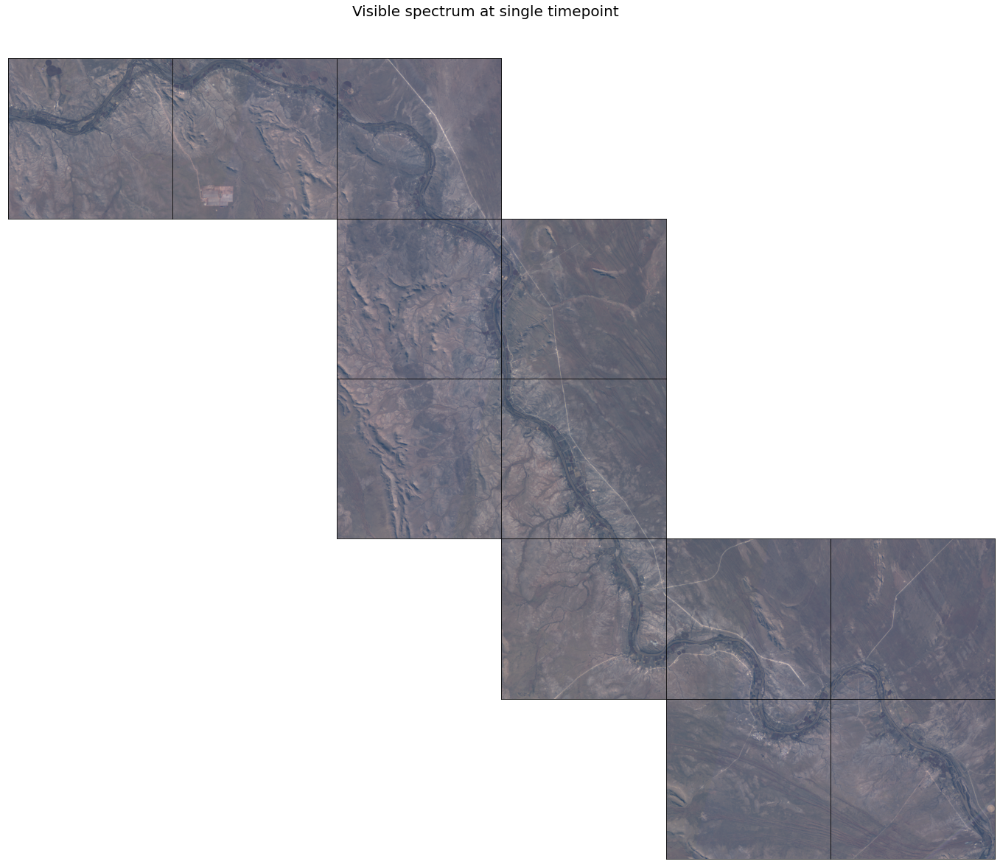

In [ ]:
## Plot visible spectrum at a particular date

fig = plt.figure(figsize=(20*6/5, 20))
k=0

date_idx=8

for i,  (idxs, plc) in enumerate(zip(indexes, places)):
    for j, (idx, p) in enumerate(zip(idxs, plc)):
        #print("i = ", i)
        #print("j = ", j)
        k=k+1
        eopatch = EOPatch.load(path_out/f'eopatch_{idx}', lazy_loading=True)
        ax = plt.subplot(5, 6, p)
        plt.imshow(np.clip(eopatch.data['BANDS'][date_idx][..., [2, 1, 0]] * 3.5, 0, 1))
        plt.xticks([])
        plt.yticks([])
        ax.set_aspect("auto")
        del eopatch
        
fig.suptitle('Visible spectrum at single timepoint', y=0.93, size=20)

fig.subplots_adjust(wspace=0, hspace=0)

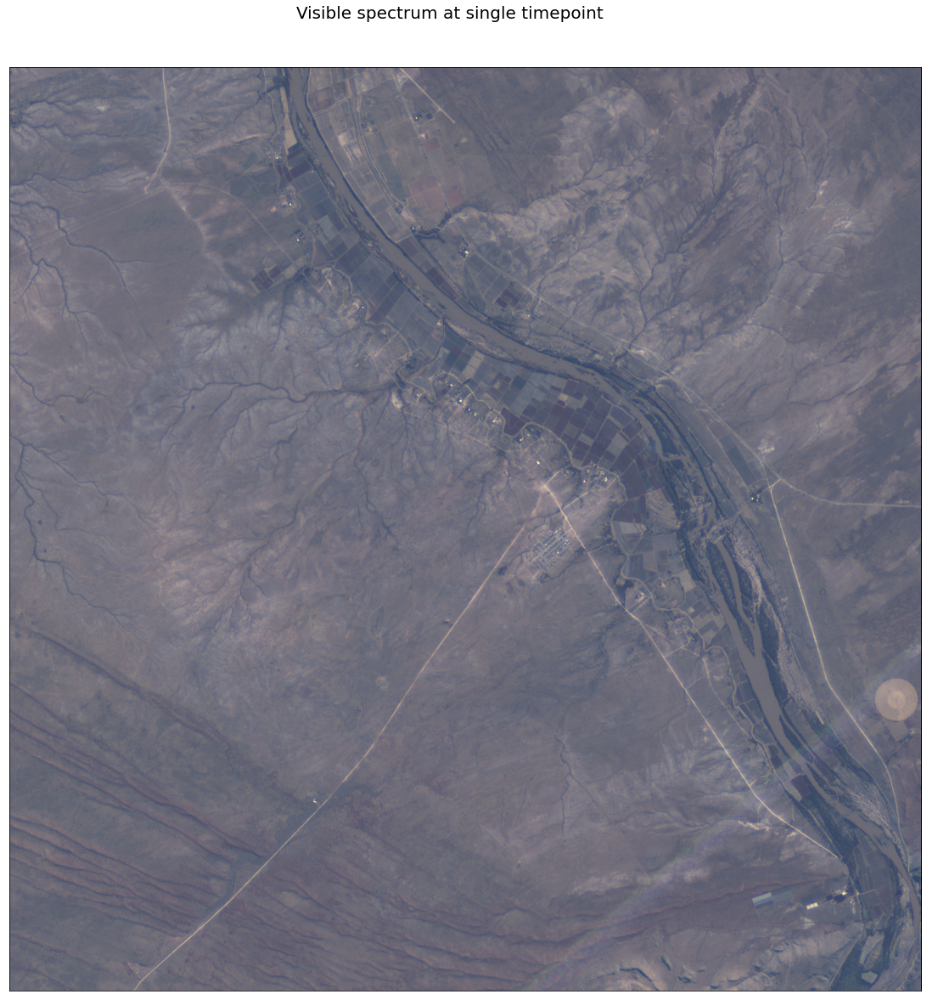

In [ ]:
## Take a closer look at a patch
#date_idx = 2

fig = plt.figure(figsize=(20,20))
eopatch = EOPatch.load(path_out/f'eopatch_10', lazy_loading=True)
plt.imshow(np.clip(eopatch.data['BANDS'][date_idx][..., [2, 1, 0]] * 3.5, 0, 1))
plt.xticks([])
plt.yticks([])

fig.suptitle('Visible spectrum at single timepoint', y=0.93, size=20)
del eopatch

### Plot cloud probability and cloud masks

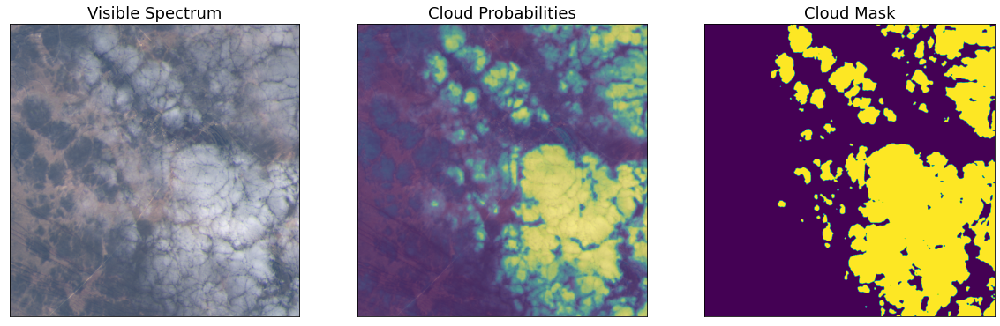

In [ ]:
## Look at the cloud probability and cloud masks

eopatch = EOPatch.load(path_out/f'eopatch_10', lazy_loading=True)

plt.figure(figsize=(20,8))

ax = plt.subplot(1, 3, 1)
plt.imshow(np.clip(eopatch.data['BANDS'][9][..., [2, 1, 0]] * 3.5, 0, 1))
ax.set_title('Visible Spectrum', size=18)
plt.xticks([])
plt.yticks([])

ax = plt.subplot(1, 3, 2)
plt.imshow(np.clip(eopatch.data['BANDS'][9][..., [2, 1, 0]] * 3.5, 0, 1))
plt.imshow(eopatch.data['CLP'][9].squeeze(),alpha =0.5)
ax.set_title('Cloud Probabilities', size=18)
plt.xticks([])
plt.yticks([])

ax = plt.subplot(1, 3, 3)
plt.imshow(eopatch.mask['CLM'][9].squeeze())
ax.set_title('Cloud Mask', size=18)
plt.xticks([])
plt.yticks([])

del eopatch

###Plot average NDVI

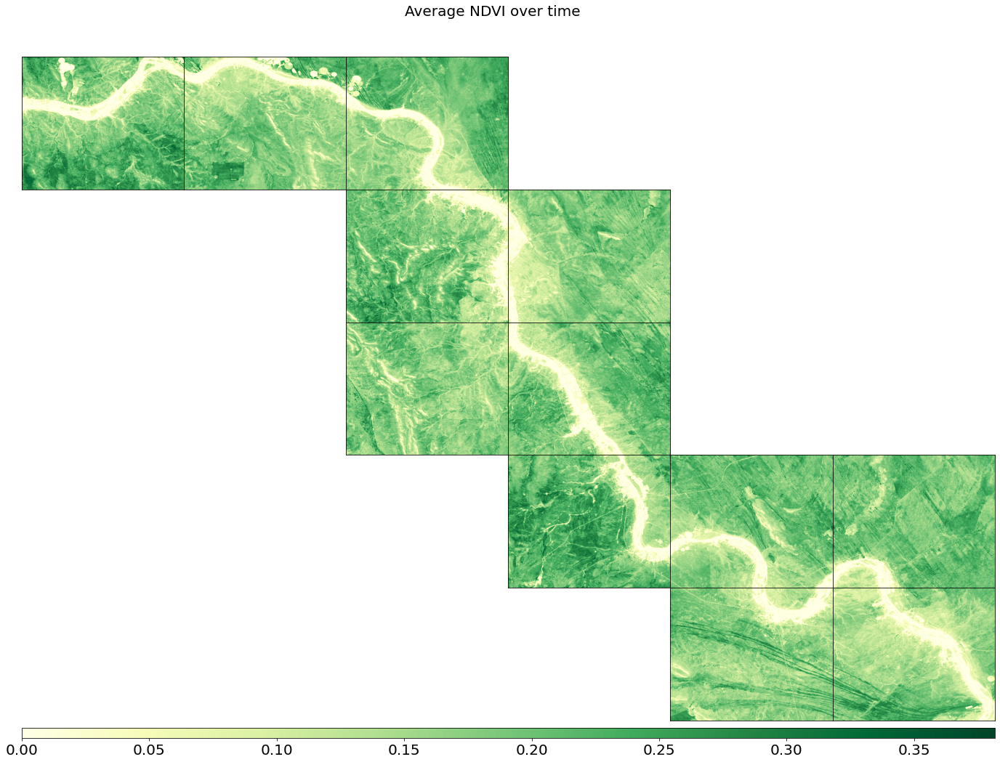

In [ ]:
## Plot average NDVI

fig = plt.figure(figsize=(20*6/5, 20))
k=0

date_idx=9

for i,  (idxs, plc) in enumerate(zip(indexes, places)):
    for j, (idx, p) in enumerate(zip(idxs, plc)):
        k=k+1
        eopatch = EOPatch.load(path_out/f'eopatch_{idx}', lazy_loading=True)
        ax = plt.subplot(5, 6, p)
        im = ax.imshow(np.clip(np.nanmean(eopatch.data['NDVI'],axis=0).squeeze(), 0, 0.8), cmap=plt.get_cmap('YlGn'))
        plt.xticks([])
        plt.yticks([])
        ax.set_aspect("auto")
        del eopatch

fig.subplots_adjust(wspace=0, hspace=0)
fig.suptitle('Average NDVI over time', y=0.93, size=20)

cb = fig.colorbar(im, ax=fig.axes, orientation='horizontal', pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)
plt.show()

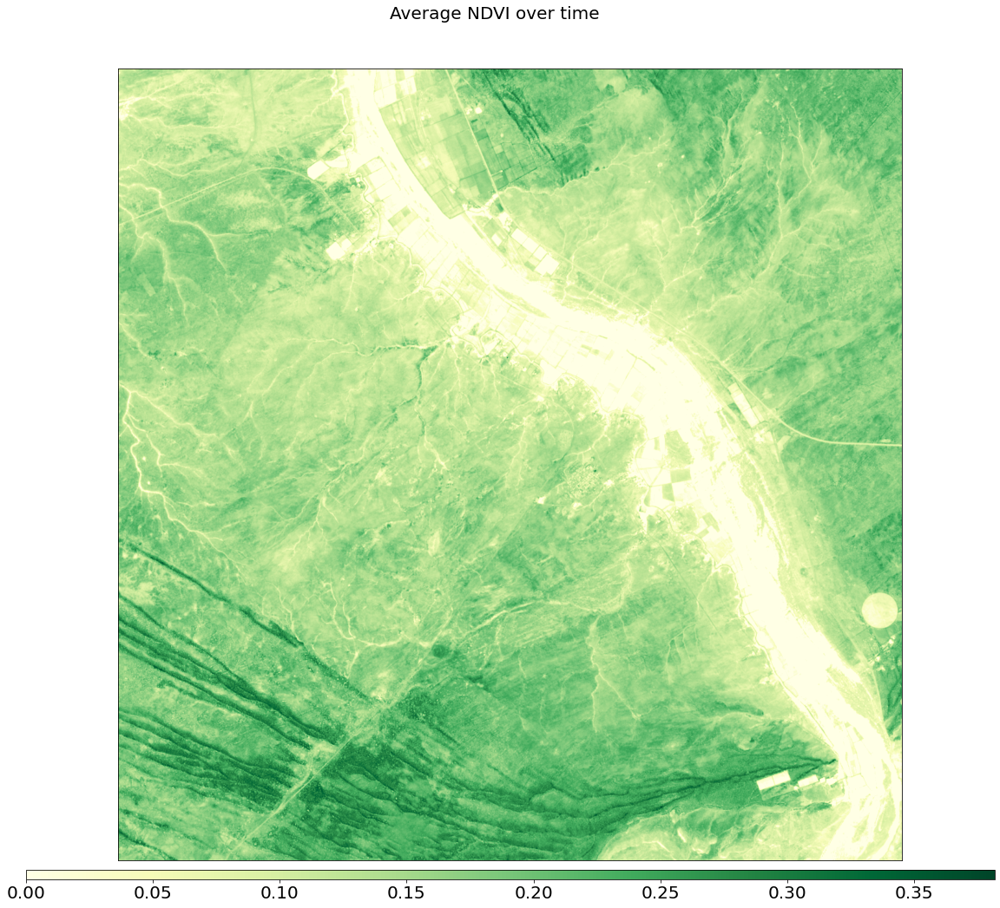

In [ ]:
fig = plt.figure(figsize=(20,20))
eopatch = EOPatch.load(path_out/f'eopatch_10', lazy_loading=True)

eopatch.mask_timeless['LULC_TRAIN'].squeeze()
im = plt.imshow(np.clip(np.nanmean(eopatch.data['NDVI'],axis=0).squeeze(), 0, 0.8), cmap=plt.get_cmap('YlGn'))
plt.xticks([])
plt.yticks([])

fig.suptitle('Average NDVI over time', y=0.93, size=20)

cb = fig.colorbar(im, ax=fig.axes, orientation='horizontal', pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)
plt.show()
del eopatch

###Plot NDWI

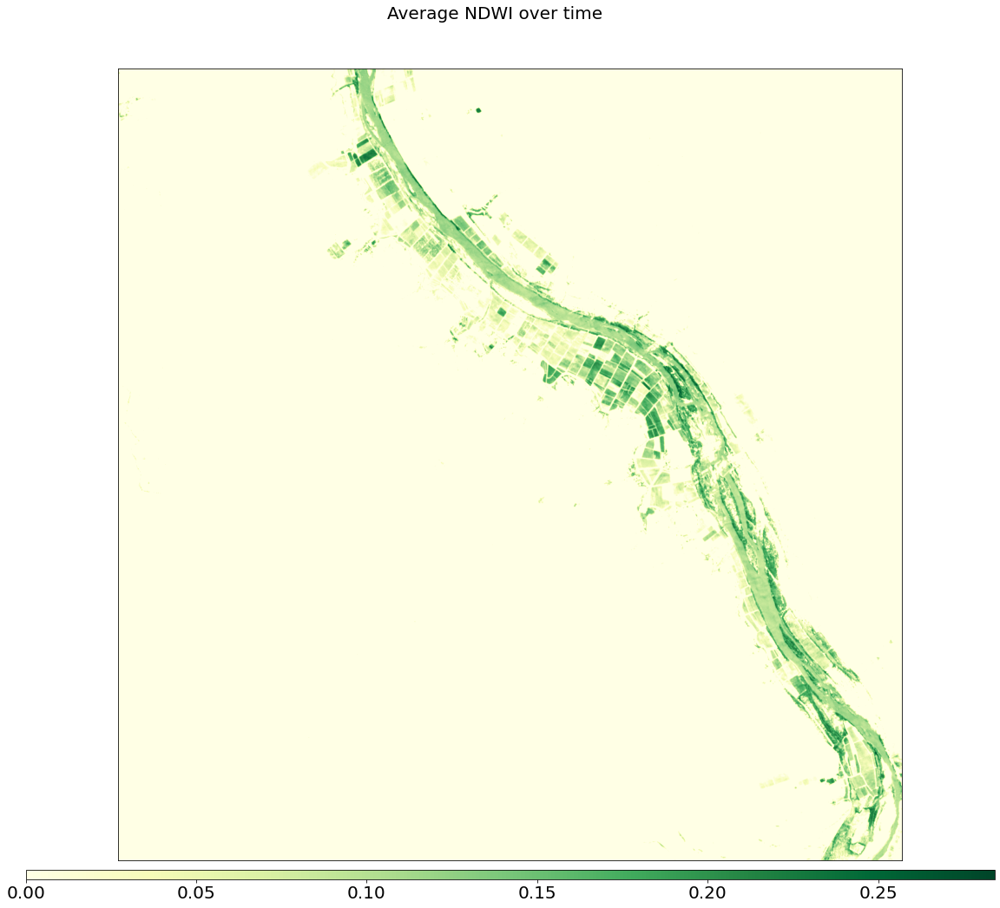

In [ ]:
fig = plt.figure(figsize=(20,20))
eopatch = EOPatch.load(path_out/f'eopatch_10', lazy_loading=True)

eopatch.mask_timeless['LULC_TRAIN'].squeeze()
im = plt.imshow(np.clip(np.nanmean(eopatch.data['NDWI'],axis=0).squeeze(), 0, 0.8), cmap=plt.get_cmap('YlGn'))
plt.xticks([])
plt.yticks([])

fig.suptitle('Average NDWI over time', y=0.93, size=20)

cb = fig.colorbar(im, ax=fig.axes, orientation='horizontal', pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)
plt.show()
del eopatch

###Plot NDBI

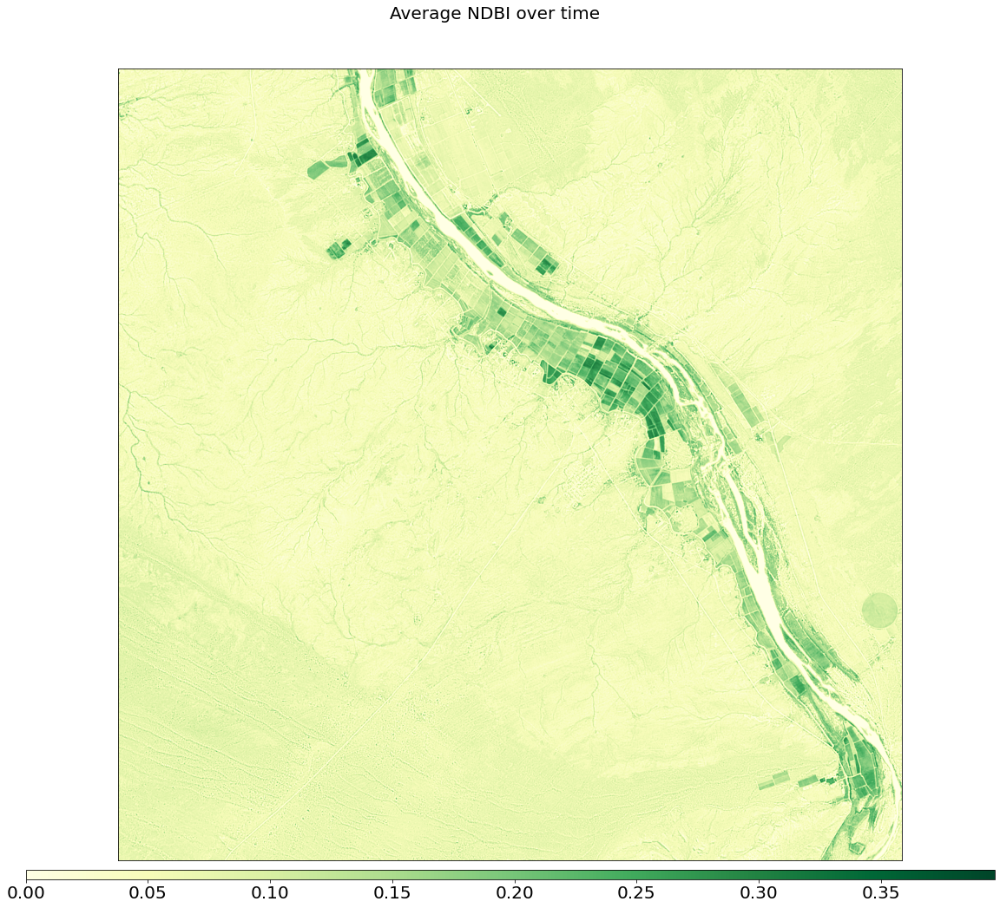

In [ ]:
fig = plt.figure(figsize=(20,20))
eopatch = EOPatch.load(path_out/f'eopatch_10', lazy_loading=True)

eopatch.mask_timeless['LULC_TRAIN'].squeeze()
im = plt.imshow(np.clip(np.nanmean(eopatch.data['NDBI'],axis=0).squeeze(), 0, 0.8), cmap=plt.get_cmap('YlGn'))
plt.xticks([])
plt.yticks([])

fig.suptitle('Average NDBI over time', y=0.93, size=20)

cb = fig.colorbar(im, ax=fig.axes, orientation='horizontal', pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)
plt.show()
del eopatch

### Plot GNDVI

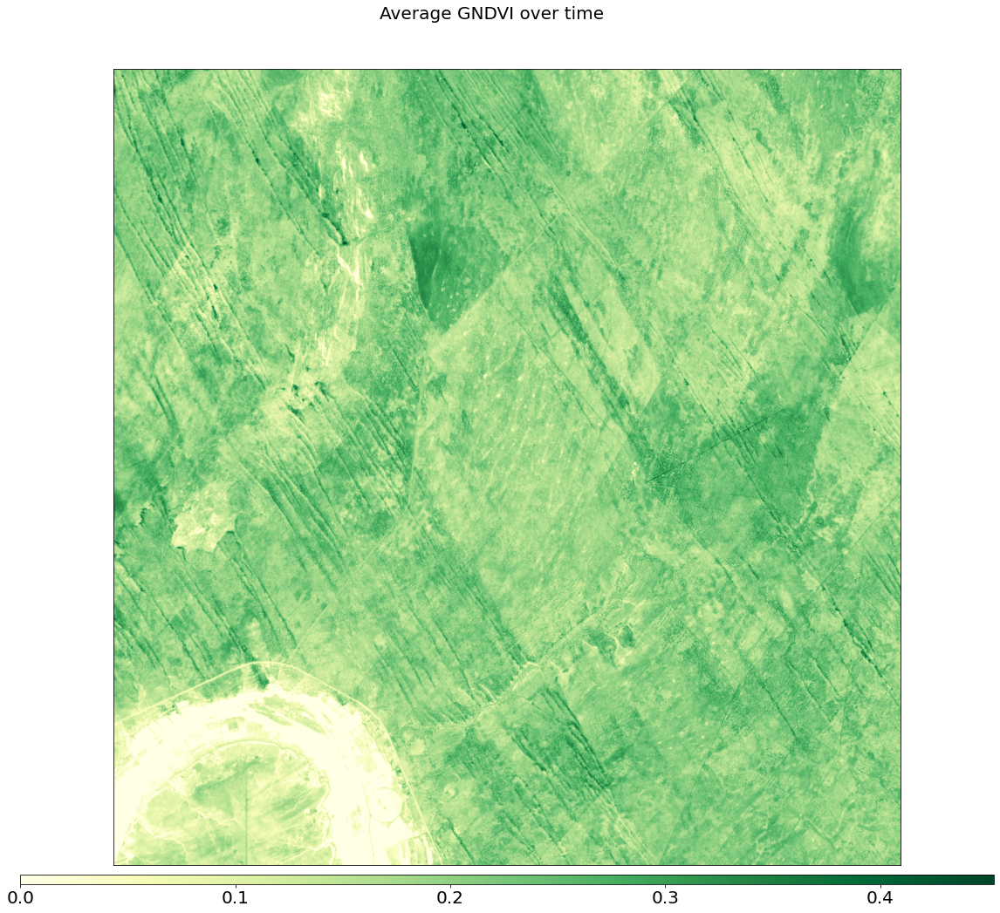

In [ ]:
fig = plt.figure(figsize=(20,20))
eopatch = EOPatch.load(path_out/f'eopatch_11', lazy_loading=True)

eopatch.mask_timeless['LULC_TRAIN'].squeeze()
im = plt.imshow(np.clip(np.nanmean(eopatch.data['GNDVI'],axis=0).squeeze(), 0, 0.8), cmap=plt.get_cmap('YlGn'))
plt.xticks([])
plt.yticks([])

fig.suptitle('Average GNDVI over time', y=0.93, size=20)

cb = fig.colorbar(im, ax=fig.axes, orientation='horizontal', pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)
plt.show()
del eopatch

###Plot raster mask

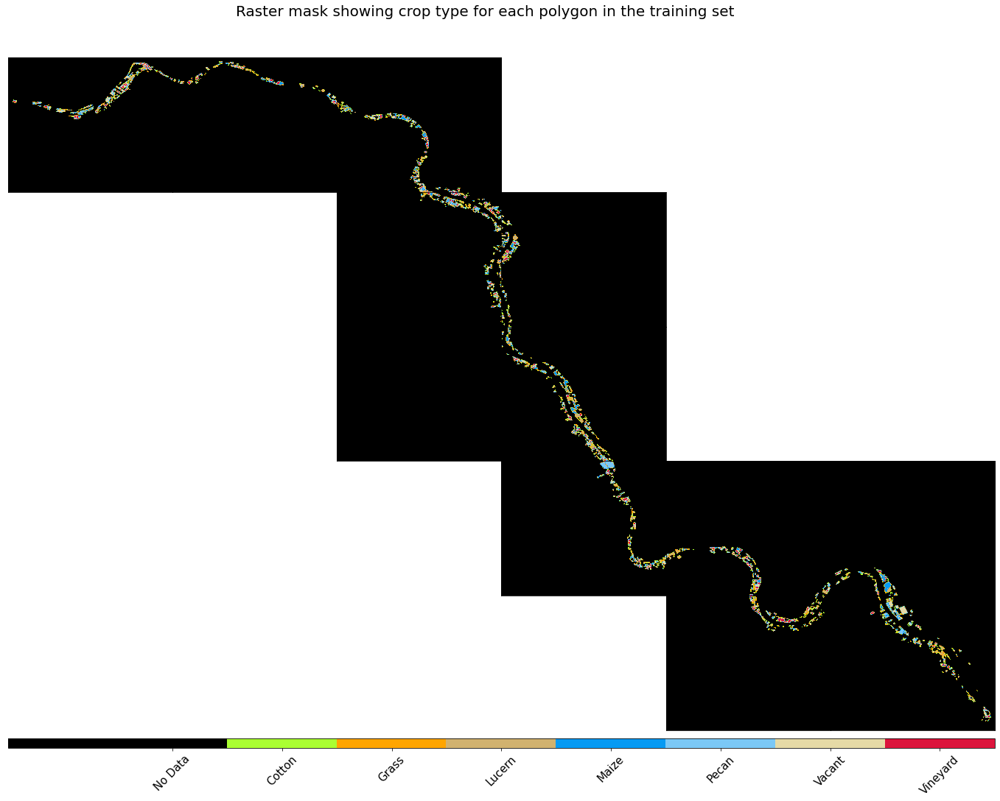

In [ ]:
## Plot raster mask

fig = plt.figure(figsize=(20*6/5, 20))
k=0

date_idx=9

for i,  (idxs, plc) in enumerate(zip(indexes, places)):
    for j, (idx, p) in enumerate(zip(idxs, plc)):
        k=k+1
        eopatch = EOPatch.load(path_out/f'eopatch_{idx}', lazy_loading=True)
        ax = plt.subplot(5, 6, p)
        im = ax.imshow(eopatch.mask_timeless['LULC_TRAIN'].squeeze(), cmap=lulc_cmap, norm=lulc_norm)
        plt.xticks([])
        plt.yticks([])
        ax.set_aspect("auto")
        del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

cb = fig.colorbar(im, ax=fig.axes, orientation='horizontal', pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20) 
cb.set_ticks([entry.id+1 for entry in LULC])
cb.ax.set_xticklabels([entry.class_name for entry in LULC], rotation=45, fontsize=15)

fig.suptitle('Raster mask showing crop type for each polygon in the training set', y=0.93, size=20)

plt.show()

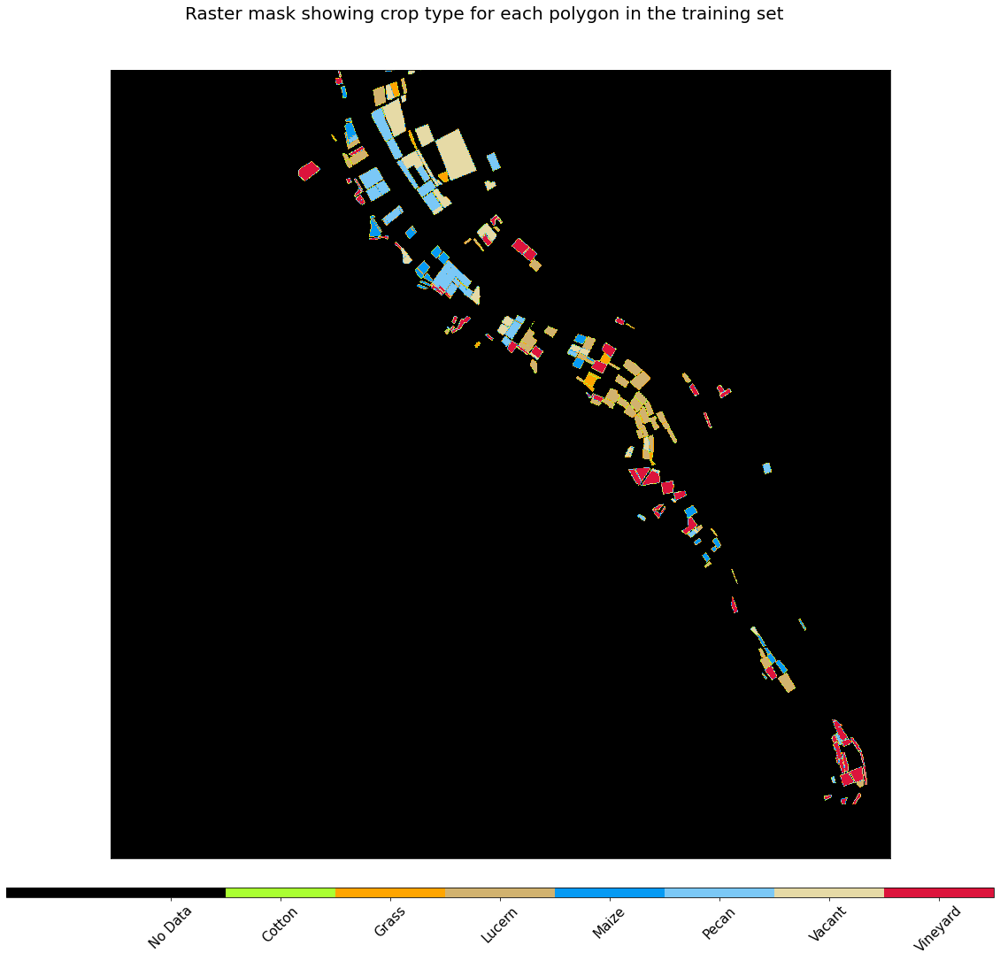

In [ ]:
## View one patch's raster mask

fig = plt.figure(figsize=(20,20))
eopatch = EOPatch.load(path_out/f'eopatch_10', lazy_loading=True)

eopatch.mask_timeless['LULC_TRAIN'].squeeze()
im = plt.imshow(eopatch.mask_timeless['LULC_TRAIN'].squeeze(), cmap=lulc_cmap, norm=lulc_norm)
plt.xticks([])
plt.yticks([])

fig.suptitle('Raster mask showing crop type for each polygon in the training set', y=0.93, size=20)

cb = fig.colorbar(im, ax=fig.axes, orientation='horizontal', pad=0.03, aspect=100)
cb.ax.tick_params(labelsize=20) 
cb.set_ticks([entry.id+1 for entry in LULC])
cb.ax.set_xticklabels([entry.class_name for entry in LULC], rotation=45, fontsize=15)
plt.show()

del eopatch

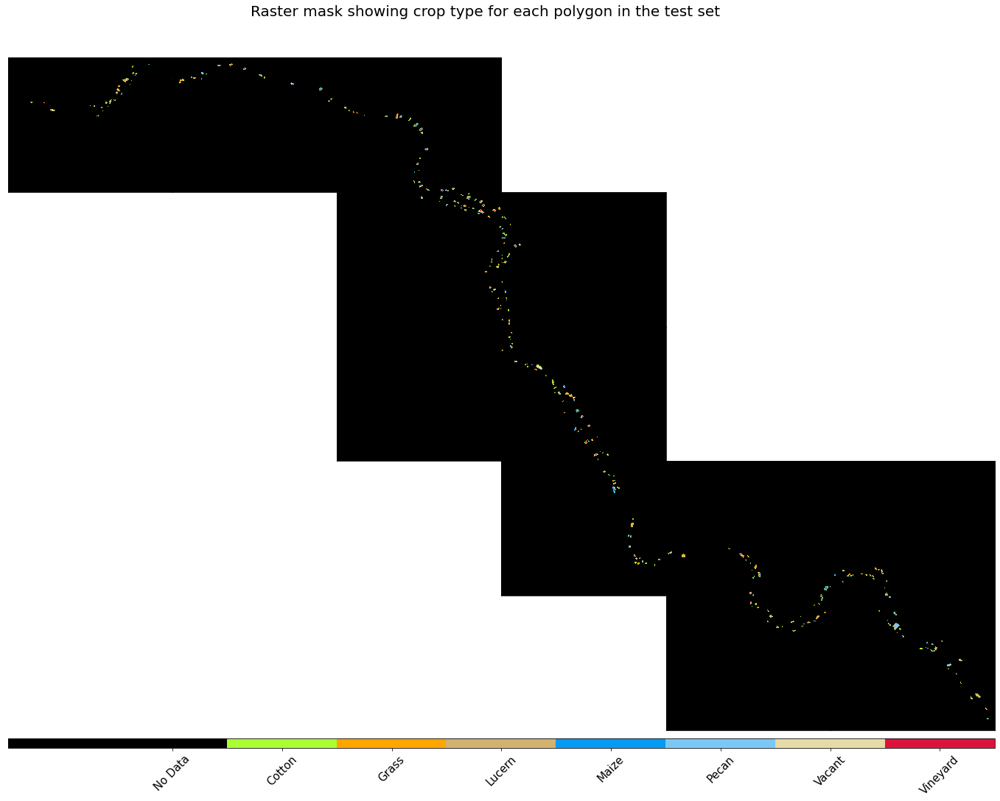

In [ ]:
## Plot raster mask

fig = plt.figure(figsize=(20*6/5, 20))
k=0

date_idx=9

for i,  (idxs, plc) in enumerate(zip(indexes, places)):
    for j, (idx, p) in enumerate(zip(idxs, plc)):
        k=k+1
        eopatch = EOPatch.load(path_out/f'eopatch_{idx}', lazy_loading=True)
        ax = plt.subplot(5, 6, p)
        im = ax.imshow(eopatch.mask_timeless['LULC_TEST'].squeeze(), cmap=lulc_cmap, norm=lulc_norm)
        plt.xticks([])
        plt.yticks([])
        ax.set_aspect("auto")
        del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

cb = fig.colorbar(im, ax=fig.axes, orientation='horizontal', pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20) 
cb.set_ticks([entry.id+1 for entry in LULC])
cb.ax.set_xticklabels([entry.class_name for entry in LULC], rotation=45, fontsize=15)

fig.suptitle('Raster mask showing crop type for each polygon in the test set', y=0.93, size=20)

plt.show()

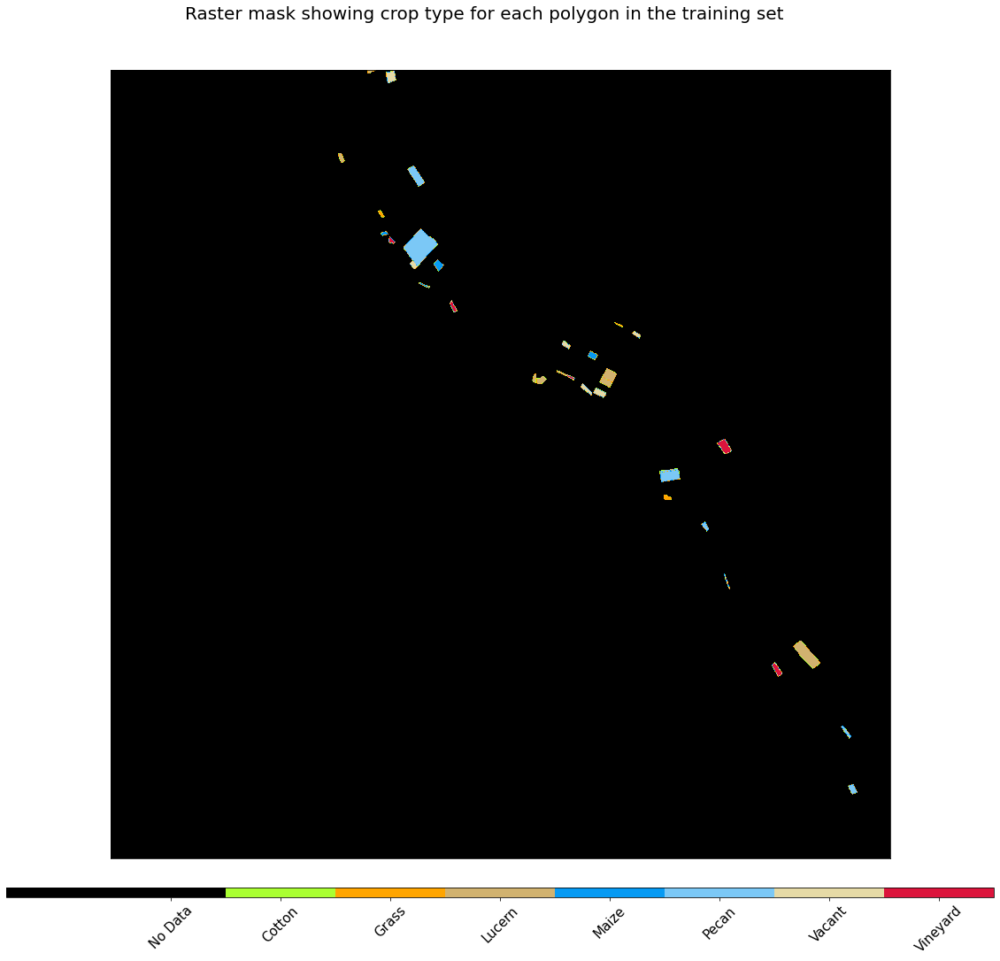

In [ ]:
## View one patch's raster mask

fig = plt.figure(figsize=(20,20))
eopatch = EOPatch.load(path_out/f'eopatch_10', lazy_loading=True)

eopatch.mask_timeless['LULC_TEST'].squeeze()
im = plt.imshow(eopatch.mask_timeless['LULC_TEST'].squeeze(), cmap=lulc_cmap, norm=lulc_norm)
plt.xticks([])
plt.yticks([])

fig.suptitle('Raster mask showing crop type for each polygon in the training set', y=0.93, size=20)

cb = fig.colorbar(im, ax=fig.axes, orientation='horizontal', pad=0.03, aspect=100)
cb.ax.tick_params(labelsize=20) 
cb.set_ticks([entry.id+1 for entry in LULC])
cb.ax.set_xticklabels([entry.class_name for entry in LULC], rotation=45, fontsize=15)
plt.show()

del eopatch

##Interpolate and extrapolate
Make composite based on NDVI and derive texture features

### Load patches

In [ ]:
print(patch_path) # str('/content/gdrive/My Drive/Colab Notebooks/Zindi/output/patches2')

/content/gdrive/My Drive/Colab Notebooks/Zindi/output/patches2


In [ ]:
type(patch_path)

pathlib.PosixPath

In [ ]:
patch_path_str = str(patch_path)
type(patch_path_str)

str

In [ ]:
patch_path_str

'/content/gdrive/My Drive/Colab Notebooks/Zindi/output/patches2'

In [ ]:
# TASK TO LOAD EXISTING EOPATCHES
load = LoadTask(patch_path_str)

###Task for filtering out too cloudy scenes

In [ ]:
class ValidDataFractionPredicate:
    """ Predicate that defines if a frame from EOPatch's time-series is valid or not. 
    Frame is valid, if the valid data fraction is above the specified threshold.
    """
    def __init__(self, threshold):
        self.threshold = threshold
        
    def __call__(self, array):
        coverage = np.sum(array.astype(np.uint8)) / np.prod(array.shape)
        return coverage > self.threshold

In [ ]:
# TASK FOR FILTERING OUT TOO CLOUDY SCENES
# keep frames with > 80 % valid coverage
valid_data_predicate = ValidDataFractionPredicate(0.8)
filter_task = SimpleFilterTask((FeatureType.MASK, 'VALID_DATA'), valid_data_predicate)

### Rasterization task

In [ ]:
#land_cover_path = data_path/'train_new_2050'
land_cover_path_train = data_path/'train_new_2050' # Contains 2050 fields
land_cover_path_train

PosixPath('/content/gdrive/My Drive/Colab Notebooks/Zindi/train_new_2050')

In [ ]:
land_cover_data_train = gpd.read_file(land_cover_path_train)
land_cover_data_train.shape

(2050, 5)

In [ ]:
land_cover_data_train.isnull().values.any()

False

In [ ]:
land_cover_data_train.to_crs({'init': 'EPSG:32734'},inplace=True)

/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [ ]:
land_cover_data_train['Field_Id'] = land_cover_data_train.Field_Id.astype(np.uint16)

In [ ]:
field_id_raster_train = VectorToRasterTask(land_cover_data_train, 
                                 (FeatureType.MASK_TIMELESS, 'FIELD_ID_TRAIN'),
                                 values_column='Field_Id', 
                                 raster_shape=(FeatureType.MASK, 'VALID_DATA'), # (1345, 1329)
                                 raster_dtype=np.uint16)

In [ ]:
#land_cover_path = data_path/'test_new_360'
land_cover_path_test = data_path/'test_new_360' # Contains 360 fields
land_cover_path_test

PosixPath('/content/gdrive/My Drive/Colab Notebooks/Zindi/test_new_360')

In [ ]:
land_cover_data_test = gpd.read_file(land_cover_path_test)
land_cover_data_test.shape

(360, 5)

In [ ]:
land_cover_data_train.isnull().values.any()

False

In [ ]:
land_cover_data_test.to_crs({'init': 'EPSG:32734'},inplace=True)

/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [ ]:
land_cover_data_test['Field_Id'] = land_cover_data_test.Field_Id.astype(np.uint16)

In [ ]:
field_id_raster_test = VectorToRasterTask(land_cover_data_test, 
                                 (FeatureType.MASK_TIMELESS, 'FIELD_ID_TEST'),
                                 values_column='Field_Id', 
                                 raster_shape=(FeatureType.MASK, 'VALID_DATA'), # (1345, 1329)
                                 raster_dtype=np.uint16)

###Erosion task

In [ ]:
# TASK FOR EROSION
# erode each class of the reference map for training set
erosion1_train = ErosionTask(mask_feature=(FeatureType.MASK_TIMELESS,'LULC_TRAIN','LULC_TRAIN_ERODED'), disk_radius=1)

erosion2_train = ErosionTask(mask_feature=(FeatureType.MASK_TIMELESS,'FIELD_ID_TRAIN','FIELD_ID_TRAIN_ERODED'), disk_radius=1)

# erode each class of the reference map for test set
erosion1_test = ErosionTask(mask_feature=(FeatureType.MASK_TIMELESS,'LULC_TEST','LULC_TEST_ERODED'), disk_radius=1)

erosion2_test = ErosionTask(mask_feature=(FeatureType.MASK_TIMELESS,'FIELD_ID_TEST','FIELD_ID_TEST_ERODED'), disk_radius=1)

### Concatenation task

In [ ]:
class ConcatenateData(EOTask):
    
    """ Task to concatenate data arrays along the last dimension
    """
    def __init__(self, feature_name, feature_names_to_concatenate):
        self.feature_name = feature_name
        self.feature_names_to_concatenate = feature_names_to_concatenate

    def execute(self, eopatch):
        eopatch.data['BANDS'] = eopatch.data['BANDS']#[:,:,:,[3, 2, 1, 7]] # RGB (Narrow NIR = 8) (NIR = 7)
        
        arrays = [eopatch.data[name] for name in self.feature_names_to_concatenate]

        #eopatch.add_feature(FeatureType.DATA, self.feature_name, np.concatenate(arrays, axis=-1))
        eopatch[FeatureType.DATA, self.feature_name] = np.concatenate(arrays, axis=-1)

        return eopatch

In [ ]:
# TASK FOR CONCATENATION
concatenate = ConcatenateData('FEATURES', ['BANDS'])
# concatenate = ConcatenateData('FEATURES', ['BANDS', 'NDVI', 'NDWI', 'NORM'])
#concatenate = MergeFeatureTask({FeatureType.DATA: ["BANDS", "NDVI", "NDWI", "NDBI", "NORM"]}, (FeatureType.DATA, "FEATURES"))

###NDVI composite

In [ ]:
  class NDVIComposite(EOTask):
    """ Task to resize feature
    """
    def __init__(self, feature = 'FEATURES', max_min = 'MAX'):
        self.feature = feature
        self.max_min = max_min

    def execute(self, eopatch):
        """ Compute composite array merging temporal frames according to the compositing method
        """
        data = eopatch.data[self.feature].copy()
        
        if self.max_min == 'MAX':
            idx = 'ARGMAX_NDVI'
        else:
            idx = 'ARGMIN_NDVI'
            
        indices = eopatch.data_timeless[idx]

        # compute composite image selecting values along temporal dimension corresponding to percentile indices
        composite_image = np.empty((data.shape[1:]), np.float32)
        composite_image[:] = np.nan
        for scene_id, scene in enumerate(data):
            composite_image = np.where(np.dstack([indices]) == scene_id, scene, composite_image)

        eopatch.data[f'COMPOSITE_{self.max_min}_NDVI'] = composite_image[None,...]

        return eopatch

In [ ]:
max_ndvi_composite = NDVIComposite(feature = 'FEATURES', max_min = 'MAX')
min_ndvi_composite = NDVIComposite(feature = 'FEATURES', max_min = 'MIN')

###Linear interpolation

In [ ]:
# TASK FOR LINEAR INTERPOLATION
# linear interpolation of full time-series and date resampling

resampled_range = ('2017-01-01', '2017-8-20', 29)
linear_interp = LinearInterpolationTask(
    (FeatureType.DATA, 'FEATURES'), # name of field to interpolate
    mask_feature=(FeatureType.MASK, 'VALID_DATA'), # mask to be used in interpolation
    copy_features=[ 
                    (FeatureType.MASK_TIMELESS, 'LULC_TRAIN'),
                    (FeatureType.MASK_TIMELESS, 'FIELD_ID_TRAIN'),
                    (FeatureType.MASK_TIMELESS, 'LULC_TEST'),
                    (FeatureType.MASK_TIMELESS, 'FIELD_ID_TEST')],
                    # (FeatureType.DATA, 'COMPOSITE_MAX_NDVI'),
                    # (FeatureType.DATA, 'COMPOSITE_MIN_NDVI'),
                    # (FeatureType.DATA_TIMELESS, 'ARGMAX_B4'),
                    # (FeatureType.DATA_TIMELESS, 'ARGMAX_NDVI'),
                    # (FeatureType.DATA_TIMELESS, 'ARGMAX_NDVI_SLOPE'),
                    # (FeatureType.DATA_TIMELESS, 'ARGMIN_B4'),
                    # (FeatureType.DATA_TIMELESS, 'ARGMIN_NDVI'),
                    # (FeatureType.DATA_TIMELESS, 'ARGMIN_NDVI_SLOPE'),
                    # (FeatureType.DATA_TIMELESS, 'STF')], # features to keep\
    resample_range=resampled_range, # set the resampling range
    bounds_error=False # extrapolate with NaN's
)

###Extrapolation

In [ ]:
fill_extrapolate = ValueFilloutTask(feature=(FeatureType.DATA,'FEATURES'), operations='fb', value=np.nan, axis=0) #fb: fwd, bwd

###HOG Task

In [ ]:
#HOGTask??

In [ ]:
hog_max_ndvi = HOGTask(feature = (FeatureType.DATA, 'COMPOSITE_MAX_NDVI', 'COMPOSITE_MAX_NDVI_HOG'))
hog_min_ndvi = HOGTask(feature = (FeatureType.DATA, 'COMPOSITE_MIN_NDVI', 'COMPOSITE_MIN_NDVI_HOG'))

AttributeError: ignored

###Resizing

In [ ]:
class Resize(EOTask):
    """ Task to resize feature
    """
    def __init__(self, feature):
        self.feature_type = feature[0]
        self.feature_name = feature[1]

    def execute(self, eopatch):
        
        new_size = eopatch.mask_timeless['FIELD_ID_TRAIN'].shape[0:2]
        
        if self.feature_type == FeatureType.DATA:
            eopatch.data[self.feature_name] = resize_images(eopatch.data[self.feature_name], new_size=new_size)
        
        if self.feature_type == FeatureType.DATA_TIMELESS:
            eopatch.data_timeless[self.feature_name] = resize_images(eopatch.data_timeless[self.feature_name], new_size=self.new_size)
        
        return eopatch

In [ ]:
resize_max_ndvi_hog = Resize(feature=(FeatureType.DATA, 'COMPOSITE_MAX_NDVI_HOG'))
resize_min_ndvi_hog = Resize(feature=(FeatureType.DATA, 'COMPOSITE_MIN_NDVI_HOG'))

###Local binary pattern

In [ ]:
#LocalBinaryPatternTask??

In [ ]:
lbpt_max = LocalBinaryPatternTask(feature = (FeatureType.DATA, 'COMPOSITE_MAX_NDVI'))
lbpt_min = LocalBinaryPatternTask(feature = (FeatureType.DATA, 'COMPOSITE_MIN_NDVI'))

###Save features

In [ ]:
features_filtered_clouds_bandsonly  = output_path/'features_filtered_clouds_bandsonly'
features_filtered_clouds_bandsonly.mkdir(exist_ok=True, parents=True)

In [ ]:
save = SaveTask(features_filtered_clouds_bandsonly, overwrite_permission=OverwritePermission.OVERWRITE_PATCH)

###Workflow execution

In [ ]:
# Define the workflow
workflow_nodes = linearly_connect_tasks(
    load,
    field_id_raster_train,
    field_id_raster_test,
    concatenate,
    filter_task,
    erosion1_train,
    erosion2_train,
    erosion1_test,
    erosion2_test,
    # max_ndvi_composite,
    # min_ndvi_composite,
    linear_interp,
    fill_extrapolate,
    #hog_max_ndvi,     
    #hog_min_ndvi,
    #resize_max_ndvi_hog,
    #resize_min_ndvi_hog,
    # lbpt_max,
    # lbpt_min,
    save
)

DEBUG:graphviz.backend.execute:run [PosixPath('dot'), '-Kdot', '-Tsvg']


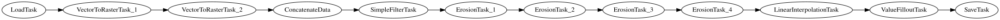

In [ ]:
workflow = EOWorkflow(workflow_nodes)

# Let's visualize it
workflow.dependency_graph()

In [ ]:
patchIDs = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

In [ ]:
input_node = workflow_nodes[0]
save_node = workflow_nodes[-1]
execution_args = []
for idx in range(len(patchIDs)):
     execution_args.append({
         input_node: {'eopatch_folder': f'eopatch_{idx}'},
         save_node: {'eopatch_folder': f'eopatch_{idx}'}
     })
executor = EOExecutor(workflow, execution_args, save_logs=True)
executor.run(workers=1)#6, multiprocess=False)
executor.make_report()
failed_ids = executor.get_failed_executions()
if failed_ids:
    raise RuntimeError(
        f"Execution failed EOPatches with IDs:\n{failed_ids}\n"
        f"For more info, check report at {executor.get_report_path()}"
    )

  0%|          | 0/12 [00:00<?, ?it/s]

Streaming output truncated to the last 5000 lines.
    service_type: 'wcs'
    size_x: '10m'
    size_y: '10m'
  }
  bbox=BBox(((535329.7703788084, 6846758.109461494), (548617.0052632861, 6860214.913734847)), crs=CRS('32734'))
  timestamp=[datetime.datetime(2017, 1, 1, 8, 23, 32), ..., datetime.datetime(2017, 8, 19, 8, 20, 11)], length=11
)], **{})
DEBUG:rasterio.env:Entering env context: <rasterio.env.Env object at 0x7f7c393528f0>
DEBUG:rasterio.env:Starting outermost env
DEBUG:rasterio.env:No GDAL environment exists
DEBUG:rasterio.env:New GDAL environment <rasterio._env.GDALEnv object at 0x7f7c396025c0> created
DEBUG:rasterio._env:GDAL data found in package: path='/usr/local/lib/python3.10/dist-packages/rasterio/gdal_data'.
DEBUG:rasterio._env:PROJ data found in package: path='/usr/local/lib/python3.10/dist-packages/rasterio/proj_data'.
DEBUG:rasterio._env:Started GDALEnv: self=<rasterio._env.GDALEnv object at 0x7f7c396025c0>.
DEBUG:rasterio.env:Entered env context: <rasterio.env.Env

OSError: ignored

In [ ]:
eopatch = EOPatch.load(features_filtered_clouds_bandsonly/'eopatch_0')

In [ ]:
eopatch

EOPatch(
  data={
    FEATURES: numpy.ndarray(shape=(8, 1345, 1329, 13), dtype=float64)
  }
  mask_timeless={
    FIELD_ID_TEST: numpy.ndarray(shape=(1345, 1329, 1), dtype=uint16)
    FIELD_ID_TRAIN: numpy.ndarray(shape=(1345, 1329, 1), dtype=uint16)
    LULC_TEST: numpy.ndarray(shape=(1345, 1329, 1), dtype=uint8)
    LULC_TRAIN: numpy.ndarray(shape=(1345, 1329, 1), dtype=uint8)
  }
  bbox=BBox(((535329.7703788084, 6846758.109461494), (548617.0052632861, 6860214.913734847)), crs=CRS('32734'))
  timestamp=[datetime.datetime(2017, 1, 1, 0, 0), ..., datetime.datetime(2017, 7, 23, 0, 0)], length=8
)

```
EOPatch(
  data: {
    COMPOSITE_MAX_NDVI: numpy.ndarray(shape=(1, 1345, 1329, 6), dtype=float64)
    COMPOSITE_MAX_NDVI_HOG: numpy.ndarray(shape=(1, 1345, 1329, 9), dtype=float64)
    COMPOSITE_MAX_NDVI_HOG_VISU: numpy.ndarray(shape=(1, 1345, 1329, 1), dtype=float64)
    COMPOSITE_MAX_NDVI_LBP: numpy.ndarray(shape=(1, 1345, 1329, 6), dtype=float64)
    COMPOSITE_MIN_NDVI: numpy.ndarray(shape=(1, 1345, 1329, 6), dtype=float64)
    COMPOSITE_MIN_NDVI_HOG: numpy.ndarray(shape=(1, 1345, 1329, 9), dtype=float64)
    COMPOSITE_MIN_NDVI_HOG_VISU: numpy.ndarray(shape=(1, 1345, 1329, 1), dtype=float64)
    COMPOSITE_MIN_NDVI_LBP: numpy.ndarray(shape=(1, 1345, 1329, 6), dtype=float64)
    FEATURES: numpy.ndarray(shape=(8, 1345, 1329, 6), dtype=float64)
  }
  mask: {}
  scalar: {}
  label: {}
  vector: {}
  data_timeless: {
    ARGMAX_B4: numpy.ndarray(shape=(1345, 1329, 1), dtype=int64)
    ARGMAX_NDVI: numpy.ndarray(shape=(1345, 1329, 1), dtype=int64)
    ARGMAX_NDVI_SLOPE: numpy.ndarray(shape=(1345, 1329, 1), dtype=uint8)
    ARGMIN_B4: numpy.ndarray(shape=(1345, 1329, 1), dtype=int64)
    ARGMIN_NDVI: numpy.ndarray(shape=(1345, 1329, 1), dtype=int64)
    ARGMIN_NDVI_SLOPE: numpy.ndarray(shape=(1345, 1329, 1), dtype=uint8)
    STF: numpy.ndarray(shape=(1345, 1329, 20), dtype=float64)
  }
  mask_timeless: {
    FIELD_ID: numpy.ndarray(shape=(1345, 1329, 1), dtype=uint16)
    LULC: numpy.ndarray(shape=(1345, 1329, 1), dtype=uint8)
  }
  scalar_timeless: {}
  label_timeless: {}
  vector_timeless: {}
  meta_info: {}
  bbox: BBox(((535329.7703788084, 6846758.109461494), (548617.0052632861, 6860214.913734847)), crs=EPSG:32734)
  timestamp: [datetime.datetime(2017, 1, 1, 0, 0), ..., datetime.datetime(2017, 7, 23, 0, 0)], length=8
)
```